In [117]:
try:
    reload(define_rgbtgassample)
    reload(dispmodels)
    reload(fitDisp)
except NameError:
    import define_rgbtgassample
    import dispmodels
    import fitDisp
    
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import emcee
import safe_colours
import pickle
import corner
import os
from galpy.util import bovy_coords
from tqdm import tqdm
from scipy.stats import gaussian_kde
safe_colours = safe_colours.initialise()
col_dict = safe_colours.distinct_named()
cm_rainbow = safe_colours.colourmap('rainbow')
cm_heat = safe_colours.colourmap('heat')
cm_diverging = safe_colours.colourmap('diverging') 

params = {'axes.labelsize': 14, 'xtick.labelsize': 12, 'ytick.labelsize': 12, 'text.usetex': True, 'lines.linewidth': 1,
          'axes.titlesize': 14, 'font.family': 'serif'}
plt.rcParams.update(params)

columnwidth = 240./72.27
textwidth = 504.0/72.27

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


def cov_vxyz_to_galcenrect_single(cov_vxyz,Xsun=1.,Zsun=0.):
    dgc= np.sqrt(Xsun**2.+Zsun**2.)
    costheta, sintheta= Xsun/dgc, Zsun/dgc
    R = np.array([[costheta,0.,-sintheta],
                  [0.,1.,0.],
                  [sintheta,0.,costheta]])
    return np.dot(R.T,np.dot(cov_vxyz,R))   

def cov_galcenrect_to_galcencyl_single(cov_galcenrect, phi):
    cosphi = np.cos(phi)
    sinphi = np.sin(phi)
    R = np.array([[cosphi, sinphi, 0.],
                 [-sinphi, cosphi, 0.],
                 [0., 0., 1.]])
    return np.dot(R, np.dot(cov_galcenrect, R.T))

def cov_vxyz_to_galcencyl(cov_vxyz, phi, Xsun=1., Zsun=0.):
    if len(np.shape(cov_vxyz)) == 3:
        cov_galcencyl = np.empty(np.shape(cov_vxyz))
        for i in tqdm(range(len(cov_vxyz))):
            cov_galcenrect = cov_vxyz_to_galcenrect_single(cov_vxyz[i], Xsun=Xsun, Zsun=Zsun)
            cov_galcencyl[i] = cov_galcenrect_to_galcencyl_single(cov_galcenrect, phi[i])
        return cov_galcencyl
    else:
        cov_galcenrect = cov_vxyz_to_galcenrect_single(cov_vxyz, Xsun=Xsun, Zsun=Zsun)
        cov_galcencyl = cov_galcenrect_to_galcencyl_single(cov_galcenrect, phi)
        return cov_galcencyl

In [73]:
if os.path.isfile('../sav/DR14_TGAS_Ages_galcencyl.npy'):
    with open('../sav/DR14_TGAS_Ages_galcencyl.npy', 'rb') as f:
        dat = np.load(f)
        Rpz = np.load(f)
        vRvTvz = np.load(f)
        cov_galcencyl = np.load(f)
else:
    dat = define_rgbtgassample.get_rgbtgassample(cuts = True, 
                                                 add_dist=True, 
                                                 add_ages=True,
                                                 rm_bad_dist=True,
                                                 distkey='BPG_meandist', 
                                                 disterrkey='BPG_diststd')
    XYZ, vxvyvz, cov_vxyz = define_rgbtgassample.dat_to_rectgal(dat, 
                                                                return_cov=True,
                                                                keys = ['ra', 'dec', 'BPG_meandist', 'pmra', 'pmdec', 'VHELIO_AVG'],
                                                                cov_keys = ['pmra_error','pmdec_error','pmra_pmdec_corr','BPG_diststd','VERR'])
    ro, vo, zo = 8., 220., 0.025
    vsolar= np.array([-10.1,4.0,6.7])
    vsun= np.array([0.,1.,0.,])+vsolar/vo
    Rpz = bovy_coords.XYZ_to_galcencyl(XYZ[:,0],XYZ[:,1],XYZ[:,2],Zsun=0.025/8.)
    vRvTvz = bovy_coords.vxvyvz_to_galcencyl(vxvyvz[:,0], vxvyvz[:,1], vxvyvz[:,2], Rpz[:,0], Rpz[:,1], Rpz[:,2],
                                                            vsun=vsun,
                                                            Xsun=1.,
                                                            Zsun=zo/ro,
                                                            galcen=True)
    cov_galcencyl = cov_vxyz_to_galcencyl(cov_vxyz, Rpz[:,1], Xsun=1., Zsun=0.025/8.)
    with open('../sav/DR14_TGAS_Ages_galcencyl_nodups.npy', 'wb') as f:
        np.save(f, dat)
        np.save(f, Rpz)
        np.save(f, vRvTvz)
        np.save(f, cov_galcencyl)

In [2]:
if os.path.isfile('../sav/DR14_TGAS_Ages_sampled.npy'):
    with open('../sav/DR14_TGAS_Ages_sampled.npy', 'rb') as f:
        dat = np.load(f)
        dataRphiz = np.load(f)
        datavRvTvz = np.load(f)
else:
    dat = define_rgbtgassample.get_rgbtgassample(cuts = True, 
                                                 add_dist=True, 
                                                 add_ages=True,
                                                 rm_bad_dist=True,
                                                 distkey='BPG_meandist', 
                                                 disterrkey='BPG_diststd')
    XYZ, vxvyvz, cov_vxyz = define_rgbtgassample.dat_to_rectgal(dat, 
                                                                return_cov=True,
                                                                keys = ['ra', 'dec', 'BPG_meandist', 'pmra', 'pmdec', 'VHELIO_AVG'],
                                                                cov_keys = ['pmra_error','pmdec_error','pmra_pmdec_corr','BPG_diststd','VERR'])
    dataRphiz, datavRvTvz = define_rgbtgassample.sample_pos_vel(dat, cov_vxyz,
                                                                nsamp = 100,
                                                                keys = ['ra', 'dec', 'BPG_meandist', 'pmra', 'pmdec', 'VHELIO_AVG'],
                                                                cov_keys = ['pmra_error','pmdec_error','pmra_pmdec_corr','BPG_diststd','VERR'])
    with open('../sav/DR14_TGAS_Ages_sampled.npy', 'wb') as f:
        np.save(f, dat)
        np.save(f, dataRphiz)
        np.save(f, datavRvTvz)

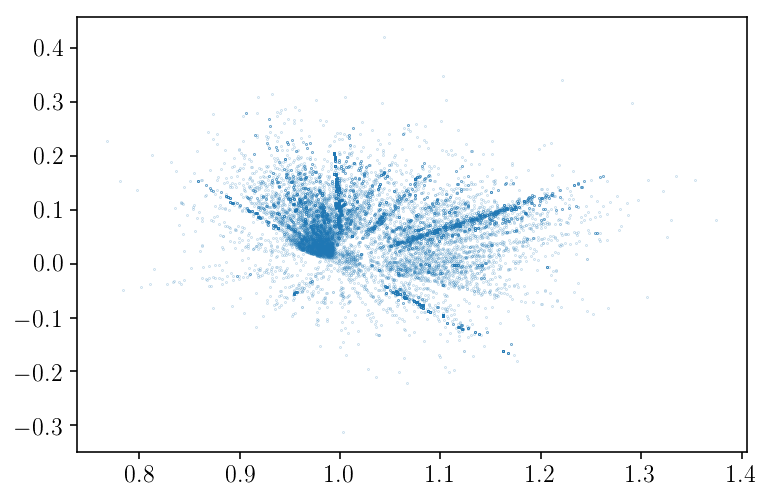

In [9]:
R = Rpz[:,0]
z = Rpz[:,2]
plt.scatter(R,z, s=0.01)

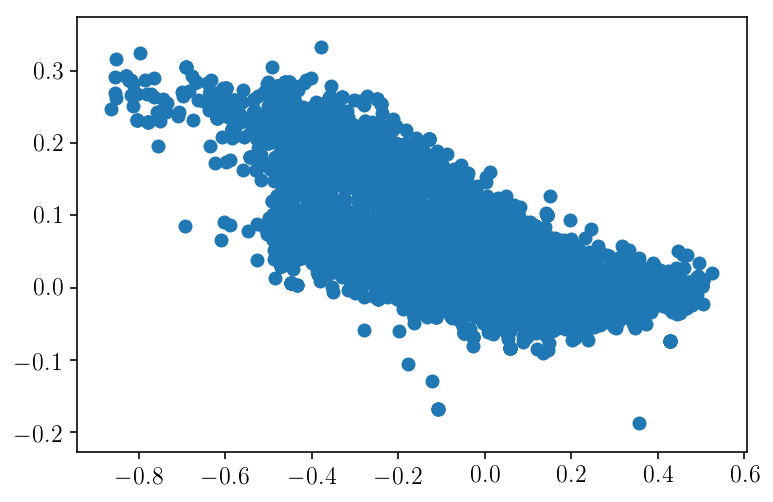

In [53]:
plt.scatter(dat['FE_H'], dat['AVG_ALPHAFE'])

## Fitting Gaussian with exponential R dependence and quadratic z dependence

In [5]:
nwalk=200
ncut=300
nit=500
threads = 16

agebins = np.arange(1.,14.,2.)
fehbins = np.arange(-0.6,0.6,0.1)

if os.path.isfile('../sav/samples_monoage_expRquadz_fixedv0.npy'):
    with open('../sav/samples_monoage_expRquadz_fixedv0.npy', 'rb') as f:
        lo_samples = np.load(f)
        hi_samples = np.load(f)
        lo_med_z = np.load(f)
        hi_med_z = np.load(f)
else:
    lo_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,9])
    hi_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,9])
    lo_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
    hi_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
    med_z_arrs = [lo_med_z, hi_med_z]
    sample_arrs = [lo_samples, hi_samples]
    for i in range(len(agebins)-1):
        for j in range(len(fehbins)-1):
            print('Age = '+str((agebins[i+1]+agebins[i])/2.)+' [Fe/H]='+str((fehbins[j]+fehbins[j+1])/2.))
            lo_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbtgassample.alphaedge(dat['FE_H']))]
            hi_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbtgassample.alphaedge(dat['FE_H']))]
            masks = [lo_mask, hi_mask]
            labs = ['low [a/Fe]', 'high [a/Fe]']
            for ii,m in enumerate(masks):
                print(labs[ii])
                if len(datavRvTvz[:,:,0][m]) < 50:
                    print('not enough data here!')
                    sample_arrs[ii][i,j] = np.ones([nwalk*nit-ncut*nwalk,9])*np.nan
                    continue
                v_R = datavRvTvz[:,:,0][m].reshape(100*len(datavRvTvz[m]))*220.
                v_z = datavRvTvz[:,:,2][m].reshape(100*len(datavRvTvz[m]))*220.
                R = dataRphiz[:,:,0][m].reshape(100*len(dataRphiz[m]))*8.
                z = dataRphiz[:,:,2][m].reshape(100*len(dataRphiz[m]))*8.
                med_z = np.nanmedian(np.fabs(z))
                med_z_arrs[ii][i,j] = np.nanpercentile(np.fabs(z), [10,25,50,75,90])
                init = [1/8.,np.log10(30.),0.,0.,1/2.5,np.log10(20.),0.,0.,0.01]
                out = fitDisp.fitDisp(R, z, v_R, v_z, med_z, 'gaussianexpRquadz', init, mcmc=True, threads=threads, ncut=ncut, nit=nit, nwalk=nwalk)
                sample_arrs[ii][i,j] = out[1]
    with open('../sav/samples_monoage_expRquadz_fixedv0.npy', 'wb') as f:
        np.save(f, lo_samples)
        np.save(f, hi_samples)
        np.save(f, lo_med_z)
        np.save(f, hi_med_z)
    

Age = 2.0 [Fe/H]=-0.55
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 2.0 [Fe/H]=-0.45
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 2.0 [Fe/H]=-0.35000000000000003
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 29498.061513
         Iterations: 427
         Function evaluations: 653
maximum likelihood params: [ 2.10790607e-01  1.91287348e+00 -2.05549427e-04 -2.60220781e-02
 -4.31239375e-01  1.50471423e+00  2.35592248e-02 -4.40945688e-03
  9.19220825e-02]


500it [00:20, 24.05it/s]


high [a/Fe]
not enough data here!
Age = 2.0 [Fe/H]=-0.25000000000000006
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 27324.598082
         Iterations: 593
         Function evaluations: 892
maximum likelihood params: [-6.68434113e-01  1.74044642e+00  2.92868499e-04 -6.91546017e-03
 -2.41034613e-02  1.56459175e+00 -5.44506589e-02  2.28105086e-02
  9.42668309e-02]


500it [00:18, 27.49it/s]


high [a/Fe]
not enough data here!
Age = 2.0 [Fe/H]=-0.15000000000000008
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 98178.236326
         Iterations: 523
         Function evaluations: 798
maximum likelihood params: [-5.11822686e-02  1.83368018e+00 -9.31463408e-02 -1.58471632e-03
 -2.92974899e-01  1.53472069e+00  2.14318567e-03  3.31837989e-02
  9.12537425e-02]


500it [01:15,  6.61it/s]


high [a/Fe]
not enough data here!
Age = 2.0 [Fe/H]=-0.0500000000000001
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 192137.994345
         Iterations: 593
         Function evaluations: 869
maximum likelihood params: [ 0.14827694  1.77837815  0.04131665 -0.03061837 -0.47100797  1.45422212
 -0.08566144 -0.02716918  0.17954149]


500it [02:37,  3.17it/s]


high [a/Fe]
not enough data here!
Age = 2.0 [Fe/H]=0.04999999999999988
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 212121.978709
         Iterations: 634
         Function evaluations: 922
maximum likelihood params: [ 0.03429061  1.81265019 -0.0199535  -0.02789061 -0.2101177   1.49042035
  0.03966223 -0.04211173  0.1105168 ]


500it [02:55,  2.84it/s]


high [a/Fe]
not enough data here!
Age = 2.0 [Fe/H]=0.14999999999999986
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 178463.781565
         Iterations: 557
         Function evaluations: 850
maximum likelihood params: [ 0.13322333  1.75530758 -0.00198649 -0.02045352  0.34775755  1.49684116
 -0.02570466 -0.01159638  0.13474432]


500it [02:38,  3.16it/s]


high [a/Fe]
not enough data here!
Age = 2.0 [Fe/H]=0.24999999999999983
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 71016.673160
         Iterations: 707
         Function evaluations: 1043
maximum likelihood params: [ 1.41718410e-01  1.76706528e+00  1.92314783e-02  1.15173650e-01
 -3.46087609e-02  1.43863734e+00 -8.42179640e-02  6.06454309e-06
  1.07079097e-01]


500it [00:55,  8.94it/s]


high [a/Fe]
not enough data here!
Age = 2.0 [Fe/H]=0.3499999999999998
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 2.0 [Fe/H]=0.44999999999999973
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=-0.55
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=-0.45
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 52999.404925
         Iterations: 562
         Function evaluations: 836
maximum likelihood params: [-3.64869599e-01  1.70326579e+00 -8.61459641e-03 -1.58499615e-02
 -1.08436567e-01  1.39780385e+00  1.23025869e-03 -1.92285912e-02
  1.22176871e-01]


500it [00:39, 12.75it/s]


high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=-0.35000000000000003
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 153457.171362
         Iterations: 442
         Function evaluations: 667
maximum likelihood params: [-0.15023925  1.84320389  0.01227296 -0.00480483  0.18477918  1.41956181
 -0.02259551  0.00193491  0.07939108]


500it [02:15,  3.70it/s]


high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=-0.25000000000000006
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 233330.836615
         Iterations: 561
         Function evaluations: 825
maximum likelihood params: [-0.39166547  1.88597099 -0.02184898  0.00857484  0.04808999  1.5669349
 -0.0290332   0.02366108  0.07764353]


500it [03:16,  2.55it/s]


high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=-0.15000000000000008
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 362124.220610
         Iterations: 624
         Function evaluations: 916
maximum likelihood params: [-2.64362094e-01  1.80042538e+00 -7.09334047e-04 -2.35272657e-02
 -1.52611237e-01  1.45489273e+00  4.35548242e-02 -6.22599826e-02
  1.17553498e-01]


500it [05:14,  1.59it/s]


high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=-0.0500000000000001
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 359354.687684
         Iterations: 733
         Function evaluations: 1074
maximum likelihood params: [ 0.03789347  1.71948062  0.01537175 -0.03705345 -0.20806076  1.47148
  0.1365099  -0.07621499  0.09778592]


500it [05:51,  1.42it/s]


high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=0.04999999999999988
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 437824.471029
         Iterations: 527
         Function evaluations: 794
maximum likelihood params: [-3.13872277e-01  1.58556099e+00  2.79764836e-03  1.53723359e-03
 -3.51896365e-01  1.40059791e+00 -2.44476278e-02  6.83473059e-03
  1.01164404e-01]


500it [07:54,  1.05it/s]


high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=0.14999999999999986
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 341460.743027
         Iterations: 469
         Function evaluations: 702
maximum likelihood params: [ 0.09462224  1.82021857  0.05921138 -0.03534906 -0.10319104  1.43394425
  0.00313726 -0.01765823  0.09699737]


500it [04:56,  1.69it/s]


high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=0.24999999999999983
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 116260.133670
         Iterations: 522
         Function evaluations: 794
maximum likelihood params: [ 0.06376494  1.84537758  0.02621077 -0.02893043  0.42732854  1.47965571
 -0.02642246 -0.00861548  0.08728731]


500it [01:38,  5.10it/s]


high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=0.3499999999999998
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 38975.395615
         Iterations: 617
         Function evaluations: 932
maximum likelihood params: [ 0.5398935   1.83344904  0.02087331 -0.04945193 -0.08409575  1.46151656
 -0.02012113  0.01596068  0.04066528]


500it [00:27, 17.95it/s]


high [a/Fe]
not enough data here!
Age = 4.0 [Fe/H]=0.44999999999999973
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 6.0 [Fe/H]=-0.55
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 6.0 [Fe/H]=-0.45
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 61519.841172
         Iterations: 591
         Function evaluations: 875
maximum likelihood params: [-0.06709167  1.69966503 -0.00206703  0.01544342 -0.09861089  1.60812292
  0.04017325 -0.06768718  0.08514682]


500it [00:43, 11.49it/s]


high [a/Fe]
not enough data here!
Age = 6.0 [Fe/H]=-0.35000000000000003
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 120159.593768
         Iterations: 507
         Function evaluations: 760
maximum likelihood params: [ 0.10327334  1.83347698 -0.08765033  0.05619078 -0.22566519  1.61757428
  0.00495351  0.00626894  0.10911515]


500it [01:40,  5.00it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 37778.130582
         Iterations: 604
         Function evaluations: 906
maximum likelihood params: [-0.0360038   1.82701897  0.00807746 -0.02244428  0.26677323  1.83490196
 -0.03536826  0.01684382  0.07274246]


500it [00:27, 18.21it/s]


Age = 6.0 [Fe/H]=-0.25000000000000006
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 211765.118864
         Iterations: 721
         Function evaluations: 1047
maximum likelihood params: [ 0.10158947  1.93505895  0.05906571 -0.1136668  -0.24416798  1.50899867
  0.01981918  0.0282718   0.12478329]


500it [02:57,  2.82it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 28042.224514
         Iterations: 488
         Function evaluations: 728
maximum likelihood params: [-0.0973497   1.81680607 -0.03751323 -0.0109656   0.3195712   1.69428771
  0.00557223  0.00711722  0.07917946]


500it [00:21, 23.01it/s]


Age = 6.0 [Fe/H]=-0.15000000000000008
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 234024.435832
         Iterations: 591
         Function evaluations: 881
maximum likelihood params: [ 1.50032138e-01  1.86391087e+00 -9.22595999e-02  4.45871720e-04
 -2.87953287e-02  1.55738626e+00 -2.96955195e-02  8.95992177e-02
  1.09923273e-01]


500it [03:20,  2.50it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 76861.569432
         Iterations: 579
         Function evaluations: 867
maximum likelihood params: [-3.21035212e-01  1.81872428e+00 -2.05150329e-04  4.86877708e-02
  1.64165908e-01  1.74816379e+00 -6.32296096e-03 -3.06175987e-02
  1.01973722e-02]


500it [01:03,  7.93it/s]


Age = 6.0 [Fe/H]=-0.0500000000000001
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 214433.610067
         Iterations: 531
         Function evaluations: 804
maximum likelihood params: [-0.16639027  1.80279317 -0.05869826 -0.00304235  0.15844814  1.54434209
  0.03014884  0.00588489  0.10358409]


500it [03:05,  2.70it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 39518.126372
         Iterations: 670
         Function evaluations: 1006
maximum likelihood params: [ 8.19212601e-01  1.98521345e+00 -1.60415544e-02 -3.50692180e-03
 -4.10460040e-01  1.69794961e+00  3.52672768e-04  4.60570280e-03
  3.21423124e-02]


500it [00:27, 18.47it/s]


Age = 6.0 [Fe/H]=0.04999999999999988
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 296985.307921
         Iterations: 483
         Function evaluations: 726
maximum likelihood params: [ 0.20210185  1.84849042 -0.05355005 -0.01838351  0.13577484  1.59058381
  0.0024474   0.0146163   0.10400656]


500it [04:01,  2.07it/s]


high [a/Fe]
not enough data here!
Age = 6.0 [Fe/H]=0.14999999999999986
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 369548.778936
         Iterations: 599
         Function evaluations: 893
maximum likelihood params: [-4.56617059e-02  1.77210944e+00 -5.75389491e-02  7.46929309e-04
 -1.45545437e-01  1.54262745e+00  2.79530997e-02 -3.57775925e-03
  1.00323668e-01]


500it [05:13,  1.60it/s]


high [a/Fe]
not enough data here!
Age = 6.0 [Fe/H]=0.24999999999999983
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 157998.414477
         Iterations: 1157
         Function evaluations: 1708
maximum likelihood params: [ -0.07175896   1.86329728   2.33537743 -31.95878158   0.35349017
   1.53981674   9.67664091  11.8323909    0.06225023]


500it [02:22,  3.51it/s]


high [a/Fe]
not enough data here!
Age = 6.0 [Fe/H]=0.3499999999999998
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 68058.263499
         Iterations: 592
         Function evaluations: 873
maximum likelihood params: [ 3.51128091e-01  1.85251966e+00 -1.21013828e-02 -7.42658693e-04
  6.78530015e-02  1.54360684e+00  4.02327926e-02 -6.75644361e-02
  8.17095608e-02]


500it [00:54,  9.12it/s]


high [a/Fe]
not enough data here!
Age = 6.0 [Fe/H]=0.44999999999999973
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 8.0 [Fe/H]=-0.55
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 8.0 [Fe/H]=-0.45
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 43631.193130
         Iterations: 513
         Function evaluations: 763
maximum likelihood params: [-0.28696559  1.75489354 -0.04776548 -0.01475707  0.31983028  1.7010401
  0.04904453 -0.00412548  0.18281382]


500it [00:32, 15.38it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 147322.087978
         Iterations: 421
         Function evaluations: 643
maximum likelihood params: [-0.12745838  1.87354046 -0.03596064 -0.0051956   0.02157144  1.83165544
  0.00888419 -0.0032825   0.07796913]


500it [01:58,  4.22it/s]


Age = 8.0 [Fe/H]=-0.35000000000000003
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 34229.470063
         Iterations: 594
         Function evaluations: 877
maximum likelihood params: [ 0.12585991  1.81429057 -0.0465521  -0.05099959 -0.09723075  1.73458506
  0.03629497 -0.05288689  0.14571766]


500it [00:25, 20.00it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 169473.644062
         Iterations: 598
         Function evaluations: 898
maximum likelihood params: [-1.04660017e-01  1.89170417e+00 -1.37617747e-02 -2.60931717e-03
  1.31124652e-01  1.77699269e+00 -1.10705373e-03 -6.48647327e-03
  6.02388948e-02]


500it [02:26,  3.41it/s]


Age = 8.0 [Fe/H]=-0.25000000000000006
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 51796.230901
         Iterations: 601
         Function evaluations: 913
maximum likelihood params: [-2.09361558e-01  1.99526320e+00  7.85104628e-04  2.22328304e-02
 -3.50030773e-01  1.39743315e+00 -1.58208547e-02 -9.84841915e-03
  6.16982038e-02]


500it [00:40, 12.33it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 193285.565230
         Iterations: 510
         Function evaluations: 770
maximum likelihood params: [-4.83697691e-02  1.87208069e+00 -6.92234653e-03 -7.87311068e-05
  3.43718598e-02  1.72449797e+00  5.29900401e-04  1.98217237e-03
  4.37487536e-02]


500it [02:46,  3.00it/s]


Age = 8.0 [Fe/H]=-0.15000000000000008
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 78527.851327
         Iterations: 540
         Function evaluations: 815
maximum likelihood params: [ 0.29788715  1.88868981 -0.0296743  -0.06451311 -0.397417    1.61453983
 -0.00673601  0.01676595  0.10524669]


500it [01:03,  7.92it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 193864.521592
         Iterations: 550
         Function evaluations: 824
maximum likelihood params: [ 1.96763369e-01  1.84213692e+00 -5.47213255e-03  4.29341028e-04
 -5.21803224e-02  1.69093182e+00 -5.35746453e-03 -1.56319064e-02
  7.28802182e-02]


500it [02:46,  3.00it/s]


Age = 8.0 [Fe/H]=-0.0500000000000001
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 94295.414446
         Iterations: 543
         Function evaluations: 830
maximum likelihood params: [-0.43958651  1.72556744 -0.04491254 -0.03313594  0.28976205  1.52805142
 -0.01048434  0.02661883  0.11904135]


500it [01:22,  6.08it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 134222.516666
         Iterations: 469
         Function evaluations: 715
maximum likelihood params: [ 0.05796924  1.87735521  0.00237556  0.00234019  0.07695125  1.67076143
 -0.01607583  0.00321677  0.02980491]


500it [02:07,  3.92it/s]


Age = 8.0 [Fe/H]=0.04999999999999988
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 183372.531608
         Iterations: 582
         Function evaluations: 878
maximum likelihood params: [ 0.13553991  1.75728754 -0.02112551 -0.00568934 -0.33544753  1.62270939
 -0.00455763  0.02169876  0.05444387]


500it [02:47,  2.98it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 118231.959527
         Iterations: 575
         Function evaluations: 859
maximum likelihood params: [-0.02046124  1.83190243 -0.06454373  0.00402315 -0.15404286  1.67894698
  0.02529963 -0.00345861  0.1251278 ]


500it [01:44,  4.78it/s]


Age = 8.0 [Fe/H]=0.14999999999999986
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 106259.694987
         Iterations: 591
         Function evaluations: 863
maximum likelihood params: [ 0.42485979  1.8194942  -0.0169939   0.00546056 -0.67768881  1.56743945
 -0.01515023 -0.00868094  0.05118609]


500it [01:45,  4.74it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 65867.746059
         Iterations: 496
         Function evaluations: 757
maximum likelihood params: [-0.35916393  1.49203851 -0.00494801 -0.01213528 -0.51153372  1.49532549
 -0.01435088 -0.01727349  0.06434782]


500it [01:17,  6.49it/s]


Age = 8.0 [Fe/H]=0.24999999999999983
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 72193.161352
         Iterations: 450
         Function evaluations: 689
maximum likelihood params: [-6.00845364e-02  1.92946376e+00  3.21412341e-04 -1.45987077e-03
 -1.44723193e-01  1.48959101e+00 -9.80102561e-03  4.74362138e-03
  4.85778910e-02]


500it [01:07,  7.39it/s]


high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 43214.120099
         Iterations: 1141
         Function evaluations: 1696
maximum likelihood params: [ 4.62411881e-01  1.97704226e+00 -6.33207739e-02  3.25730853e-02
  5.31900699e-01  1.83708766e+00 -2.12380804e-03  4.55315939e-02
  6.07047209e-09]


500it [00:38, 12.83it/s]


Age = 8.0 [Fe/H]=0.3499999999999998
low [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 42793.932714
         Iterations: 482
         Function evaluations: 724
maximum likelihood params: [ 7.78207095e-02  1.58232380e+00 -7.93462183e-03 -3.58050573e-03
 -2.23038239e-02  1.69738474e+00 -6.16045806e-03 -1.24400033e-03
  6.26095994e-02]


500it [00:39, 12.55it/s]


high [a/Fe]
not enough data here!
Age = 8.0 [Fe/H]=0.44999999999999973
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 10.0 [Fe/H]=-0.55
low [a/Fe]
not enough data here!
high [a/Fe]
not enough data here!
Age = 10.0 [Fe/H]=-0.45
low [a/Fe]
not enough data here!
high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 57414.928905
         Iterations: 510
         Function evaluations: 776
maximum likelihood params: [ 6.68652156e-02  2.06158965e+00 -3.10596796e-02  8.82131317e-04
 -5.37351188e-02  1.84928548e+00  5.86080313e-02 -1.18869938e-01
  1.65683819e-01]


500it [00:47, 10.54it/s]


Age = 10.0 [Fe/H]=-0.35000000000000003
low [a/Fe]
not enough data here!
high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 61749.921058
         Iterations: 470
         Function evaluations: 706
maximum likelihood params: [ 0.08189803  2.00531676 -0.07530348 -0.00246161  0.05983382  1.82082793
  0.00351666 -0.00425899  0.15414088]


500it [00:51,  9.73it/s]


Age = 10.0 [Fe/H]=-0.25000000000000006
low [a/Fe]
not enough data here!
high [a/Fe]
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 54460.726625
         Iterations: 501
         Function evaluations: 748
maximum likelihood params: [-0.39608495  2.03569617  0.00986911 -0.01052924  0.43916851  1.80020404
 -0.0124143   0.00312975  0.08088794]


OSError: [Errno 24] Too many open files

In [ ]:
np.shape(co_samples)

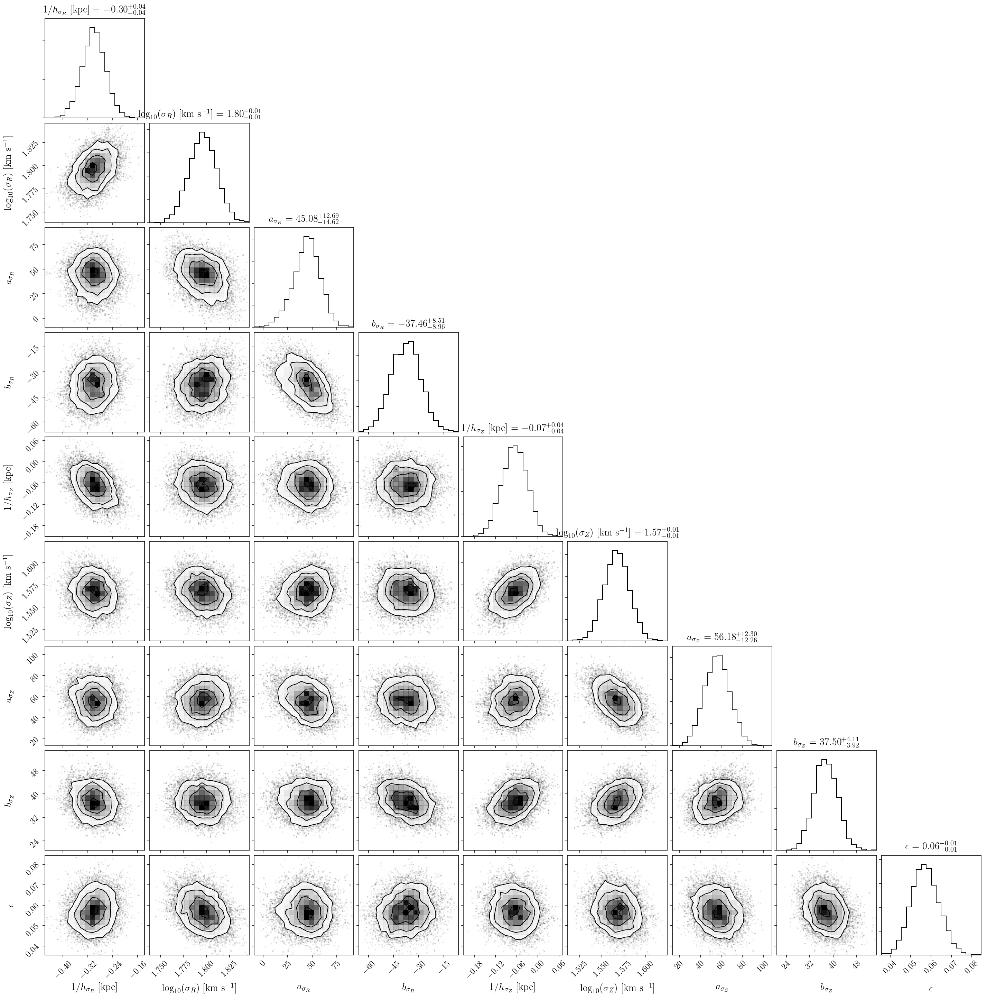

In [10]:
labels = [r'$1/h_{\sigma_R}\ \mathrm{[kpc]}$',
          r'$\log_{10}(\sigma_R)\ \mathrm{[km\ s^{-1}]}$',
          r'$a_{\sigma_R}$',
          r'$b_{\sigma_R}$',
          r'$1/h_{\sigma_Z}\ \mathrm{[kpc]}$',
          r'$\log_{10}(\sigma_Z)\ \mathrm{[km\ s^{-1}]}$',
          r'$a_{\sigma_Z}$',
          r'$b_{\sigma_Z}$',
          r'$\epsilon$',
          r'$v_0$']
fig = corner.corner(lo_samples[0,4,::3], labels=labels, show_titles=True)

In [11]:
lo_par = np.empty([len(agebins)-1,len(fehbins)-1,9,3])
hi_par = np.empty([len(agebins)-1,len(fehbins)-1,9,3])
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        lo_par[i,j] = np.percentile(lo_samples[i,j], [16,50,84], axis=0).T
        hi_par[i,j] = np.percentile(hi_samples[i,j], [16,50,84], axis=0).T


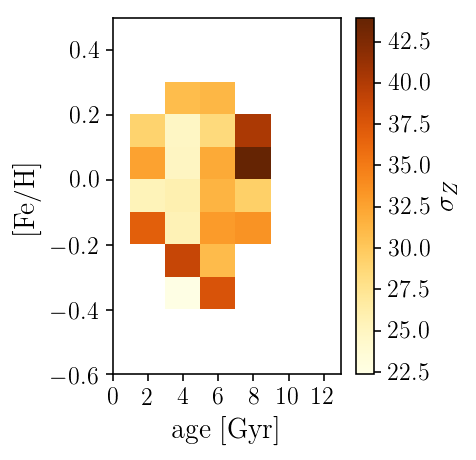

In [12]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(10**np.rot90(lo_par[:,:,5,1]), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

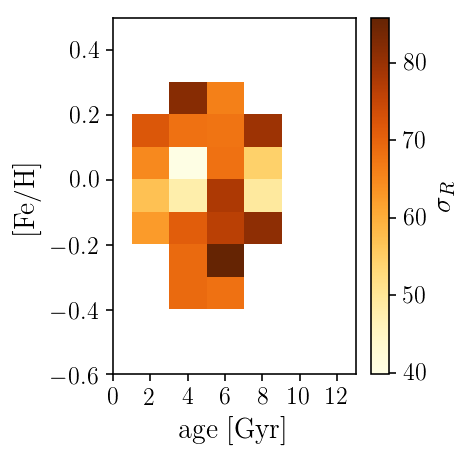

In [13]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(10**np.rot90(lo_par[:,:,1,1]), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{R}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

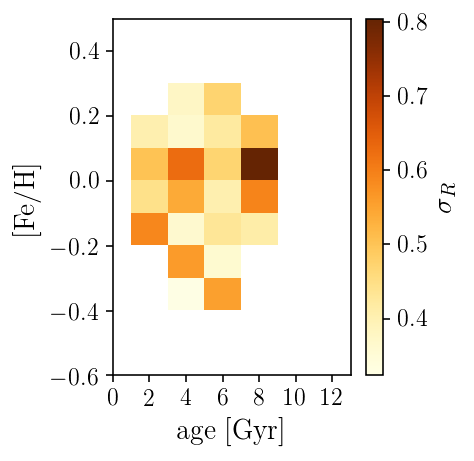

In [14]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(10**np.rot90(lo_par[:,:,5,1])/10**np.rot90(lo_par[:,:,1,1]), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{R}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

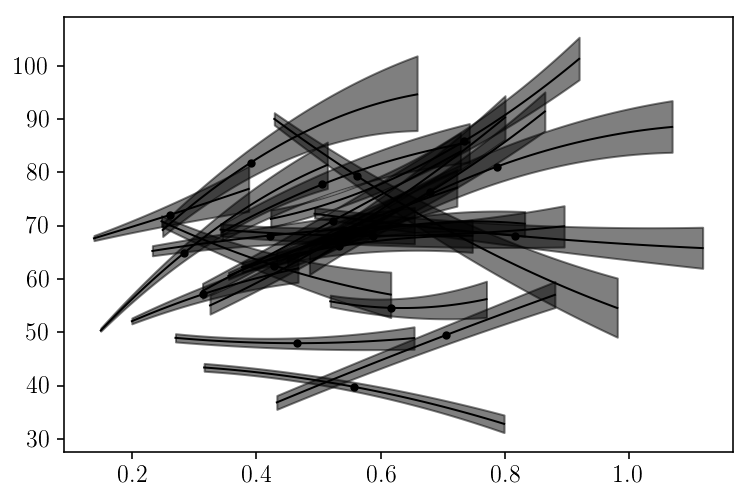

In [15]:
def sigma_profile(zs, a,b,c,med_z):
    prof = a*(zs-med_z)**2+b*(zs-med_z)+c
    return prof

def sigma_fz(par, i, j, med_z, sigmaR=False, returnprof=False, ax=None, color='Black'):
    zs = np.linspace(med_z[i,j][1], med_z[i,j][3], 50)
    if not sigmaR:
        a,b,c = par[i,j,6,1], par[i,j,7,1], 10**par[i,j,5,1]
        medianprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,6,0], par[i,j,7,0], 10**par[i,j,5,0]
        loprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,6,2], par[i,j,7,2], 10**par[i,j,5,2]
        hiprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        pind = 5
    else:
        a,b,c = par[i,j,2,1], par[i,j,3,1], 10**par[i,j,1,1]
        medianprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,2,0], par[i,j,3,0], 10**par[i,j,1,0]
        loprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,2,2], par[i,j,3,2], 10**par[i,j,1,2]
        hiprof = sigma_profile(zs, a, b, c, med_z[i,j,2])   
        pind = 1
    if returnprof:
        return zs, medianprof, loprof, hiprof
    if not ax == None:
        ax.plot(zs, medianprof, color=color)
        ax.fill_between(zs, loprof, hiprof, color=color, alpha=0.5)
        ax.scatter(med_z[i,j,2], 10**par[i,j,pind,1], color=color, s=10)
        return None
    plt.plot(zs, medianprof, color=color)
    plt.fill_between(zs, loprof, hiprof, color=color, alpha=0.5)
    plt.scatter(med_z[i,j,2], 10**par[i,j,pind,1], color=color, s=10)   
    

fig = plt.figure()

for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        sigma_fz(lo_par, i, j, lo_med_z, sigmaR=True)
        

In [ ]:
from tqdm import tqdm_notebook
from scipy.special import logsumexp
from scipy.optimize import fmin
import corner

def gaussian_fixedv0(v_R, v_z, R, z, params=[30.,30.,0.1]):
    sigmaR, sigmaz, contfrac = params
    vo = 0.
    contA = (contfrac)*(1./(100*np.sqrt(2*np.pi)))
    contE_R = (-(v_R-vo)**2/(2*100**2))
    contE_z = (-(v_z-vo)**2/(2*100**2))
    A_R = (1-contfrac)*(1./(sigmaR*np.sqrt(2*np.pi)))
    A_z = (1-contfrac)*(1./(sigmaz*np.sqrt(2*np.pi)))
    E_R = (-(v_R-vo)**2)/(2*sigmaR**2)
    E_z = (-(v_z-vo)**2)/(2*sigmaz**2)
    Es = np.dstack([E_R, E_z, contE_R, contE_z])[0]
    As = np.dstack([A_R, A_z, contA, contA])[0]
    logp = logsumexp(Es, b=As, axis=1)
    logp = np.sum(logp)
    return logp

def gaussian_expR_quadz_fixedv0(v_R, v_z, R, z, med_z, params=[1/8.,np.log10(50.),1.,1.,1/8.,np.log10(50.),1.,1.,0.01]):
    R0 = 8.
    h_sigmaR, sigmaR, a_R, b_R, h_sigmaz, sigmaz, a_z, b_z, contfrac = params
    h_sigmaR, h_sigmaz = 1/h_sigmaR, 1/h_sigmaz
    sigmaR, sigmaz = 10**sigmaR, 10**sigmaz
    z = np.fabs(z)
    vo = 0.
    sigma_fRz_R = (a_R*(z-med_z)**2+b_R*(z-med_z)+sigmaR)*(np.exp(-1*(R-R0)/h_sigmaR))
    A_R = (1-contfrac)*(1./(sigma_fRz_R*np.sqrt(2*np.pi)))
    E_R =  (-(v_R-vo)**2)/(2*sigma_fRz_R**2)
    sigma_fRz_z = (a_z*(z-med_z)**2+b_z*(z-med_z)+sigmaz)*(np.exp(-1*(R-R0)/h_sigmaz))
    A_z = (1-contfrac)*(1./(sigma_fRz_z*np.sqrt(2*np.pi)))
    E_z =  (-(v_z-vo)**2)/(2*sigma_fRz_z**2)
    contA = (contfrac)*(1./(100*np.sqrt(2*np.pi)))
    contE_R = (-(v_R-vo)**2/(2*100**2))
    contE_z = (-(v_z-vo)**2/(2*100**2))
    As = np.dstack([A_R, A_z, np.ones(len(v_R))*contA, np.ones(len(v_R))*contA])[0]
    Es = np.dstack([E_R, E_z, contE_R, contE_z])[0]
    logp = logsumexp(Es, b=As, axis=1)
    logp = np.nansum(logp)
    return logp

def lnprior(theta):
    if len(theta) == 9:
        hsigmaR, sigmaR, a_R, b_R, hsigmaz, sigmaz, a_z, b_z, c = theta
        if 1. < 10**sigmaR < 200. and \
            1. < 10**sigmaz < 200. and \
            0. < c < 1.:
            return 0.0
        return -np.inf
    else:
        sigmaR, sigmaz, c = theta
        if 1. < sigmaR < 200. and \
            1. < sigmaz < 200. and \
            0. < c < 1.:
            return 0.0
        return -np.inf

def lnprob(params, v_R, v_z, R, z, med_z):
    logprior = lnprior(params)
    if not np.isfinite(logprior):
        return -np.inf
    return logprior + gaussian_expR_quadz_fixedv0(v_R, v_z, R, z, med_z, params=params)
    

tout = fmin(lambda x: -lnprob(x, R, z, v_R, v_z, med_z), params, disp=True)
it = 300
ndim, nwalkers = 9, 200
pos = np.fabs([out[0]+np.random.randn(ndim) for i in range(nwalkers)])
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(v_R[::10], v_z[::10], R[::10], z[::10], med_z), threads=16)
for i, result in tqdm_notebook(enumerate(sampler.sample(pos, iterations=it))):
    continue
samples = sampler.chain[:,50:,:].reshape((-1,ndim))


In [ ]:
labels = [r'$1/h_{\sigma_R}\ \mathrm{[kpc]}$',
          r'$\log_{10}(\sigma_R)\ \mathrm{[km\ s^{-1}]}$',
          r'$a_{\sigma_R}$',
          r'$b_{\sigma_R}$',
          r'$1/h_{\sigma_Z}\ \mathrm{[kpc]}$',
          r'$\log_{10}(\sigma_Z)\ \mathrm{[km\ s^{-1}]}$',
          r'$a_{\sigma_Z}$',
          r'$b_{\sigma_Z}$',
          r'$\epsilon$',
          r'$v_0$']
fig = corner.corner(out[1][::3], show_titles=True, labels=labels)

In [ ]:
percentiles = np.percentile(out[1], [25,50,75], axis=0)
test = percentiles[1]

In [ ]:
def sigma_z0(a,b,c,med_z):
    return a*(-med_z)**2+b*(-med_z)+c

def sigma_profile(zs, a,b,c,med_z):
    prof = a*(zs-med_z)**2+b*(zs-med_z)+c
    return prof

print sigma_z0(test[2],test[3],10**test[1], med_z), sigma_z0(test[6],test[7],10**test[5], med_z)

zrange = np.percentile(z,[10,90])
zs = np.linspace(zrange[0], zrange[1], 100)

upper = sigma_profile(zs, percentiles[2][2],percentiles[2][3],10**percentiles[2][1], med_z)
lower = sigma_profile(zs, percentiles[0][2],percentiles[0][3],10**percentiles[0][1], med_z)


plt.plot(zs, sigma_profile(zs, test[2],test[3],10**test[1], med_z))
plt.fill_between(zs, upper, lower, alpha=0.5)
plt.scatter(med_z, sigma_profile(med_z, test[2],test[3],10**test[1], med_z))

In [ ]:
bins = np.linspace(-300.,300.,100)
plt.hist(v_R, normed=True, bins=bins)

sigmaR = 10**test[1]
contfrac = test[8]
vo = test[9]
vs = np.linspace(-300.,300.,200)
A_R = (1-contfrac)*(1./(sigmaR*np.sqrt(2*np.pi)))
E_R = (-(vs-vo)**2)/(2*sigmaR**2)
contA = (contfrac)*(1./(100*np.sqrt(2*np.pi)))
contE_R = (-(vs-vo)**2/(2*100**2))


plt.plot(vs, A_R*np.exp(E_R)+contA*np.exp(contE_R))

In [ ]:
bins = np.linspace(-300.,300.,100)
plt.hist(v_z, normed=True, bins=bins)

sigmaR = 10**test[5]
vo = test[9]
vs = np.linspace(-300.,300.,200)
A_R = (1-contfrac)*(1./(sigmaR*np.sqrt(2*np.pi)))
E_R = (-(vs-vo)**2)/(2*sigmaR**2)
contA = (contfrac)*(1./(100*np.sqrt(2*np.pi)))
contE_R = (-(vs-vo)**2/(2*100**2))
plt.plot(vs, A_R*np.exp(E_R)+contA*np.exp(contE_R))

In [ ]:
np.std(v_R)

In [ ]:

sigmaR = 30.
vo = 0.
vs = np.linspace(-300.,300.,200)
A_R = (1./(sigmaR*np.sqrt(2*np.pi)))
E_R = (-(v_R-vo)**2)/(2*sigmaR**2)
#lp_R = logsumexp(E_R, b=A_R)

In [ ]:
np.sum(np.log(A_R*np.exp(E_R)))

In [ ]:
p = np.log(A_R*np.exp(E_R))
len(v_R[~np.isfinite(p)])

In [ ]:
nwalk=200
ncut=300
nit=500
threads = 16

agebins = np.arange(-0.1,0.35,0.05)
fehbins = np.arange(-0.6,0.5,0.1)

med_zs = np.empty([len(agebins)-1,len(fehbins)-1,5])
samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,9])

for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        print '[a/Fe] = '+str((agebins[i+1]+agebins[i])/2.)+' [Fe/H]='+str((fehbins[j]+fehbins[j+1])/2.)
        m = [(dat['AVG_ALPHAFE'] > agebins[i]) & (dat['AVG_ALPHAFE'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]
        if len(datavRvTvz[:,:,0][m]) < 100:
            print 'not enough data here!'
            samples[i,j] = np.ones([nwalk*nit-ncut*nwalk,9])*np.nan
            continue
        v_R = datavRvTvz[:,:,0][m].reshape(100*len(datavRvTvz[m]))*220.
        v_z = datavRvTvz[:,:,2][m].reshape(100*len(datavRvTvz[m]))*220.
        R = dataRphiz[:,:,0][m].reshape(100*len(dataRphiz[m]))*8.
        z = dataRphiz[:,:,2][m].reshape(100*len(dataRphiz[m]))*8.
        med_z = np.nanmedian(z)
        med_zs[i,j] = np.nanpercentile(z, [10,25,50,75,90])
        init = [1/8.,np.log10(30.),0.,0.,1/2.5,np.log10(20.),0.,0.,0.01]
        out = fitDisp.fitDisp(R, z, v_R, v_z, med_z, 'gaussianexpRquadz', init, mcmc=True, threads=threads, ncut=ncut, nit=nit, nwalk=nwalk)
        samples[i,j] = out[1]

In [ ]:
saveobj = [samples, med_zs]
with open('../sav/samples_monoabundance_expRquadz_fixedv0.dat', 'w') as f:
    pickle.dump(saveobj, f)

In [ ]:
with open('../sav/samples_monoabundance_expRquadz_fixedv0.dat', 'rb') as f:
    saveobj = pickle.load(f)
samples, med_zs = saveobj
agebins = np.arange(-0.1,0.35,0.05)
fehbins = np.arange(-0.6,0.5,0.1)



In [ ]:
ab_par = np.empty([len(agebins)-1,len(fehbins)-1,9,3])

for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        ab_par[i,j] = np.percentile(samples[i,j], [16,50,84], axis=0).T

In [ ]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [fehbins[0], fehbins[-1],agebins[0], agebins[-1]]
s0 = plt.imshow(10**ab_par[:,:,5,1][::-1], extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{[\alpha/Fe]}$')
fig.tight_layout()

In [ ]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [fehbins[0], fehbins[-1],agebins[0], agebins[-1]]
s0 = plt.imshow(10**ab_par[:,:,1,1][::-1], extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{R}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{[\alpha/Fe]}$')
fig.tight_layout()

In [ ]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [fehbins[0], fehbins[-1],agebins[0], agebins[-1]]
s0 = plt.imshow(10**ab_par[:,:,5,1][::-1]/10**ab_par[:,:,1,1][::-1], extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{R}/\sigma_{z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{[\alpha/Fe]]}$')
fig.tight_layout()

In [ ]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [fehbins[0], fehbins[-1],agebins[0], agebins[-1]]
s0 = plt.imshow(ab_par[:,:,8,1][::-1], extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\epsilon_j$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{[\alpha/Fe]]}$')
fig.tight_layout()

In [ ]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [fehbins[0], fehbins[-1],agebins[0], agebins[-1]]
s0 = plt.imshow(ab_par[:,:,0,1][::-1], extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$h_{\sigma_{R}}\ \mathrm{[kpc]}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{[\alpha/Fe]]}$')
fig.tight_layout()

In [ ]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [fehbins[0], fehbins[-1],agebins[0], agebins[-1]]
s0 = plt.imshow(ab_par[:,:,4,1][::-1], extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$1/h_{\sigma_{z}}\ \mathrm{[kpc]}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{[\alpha/Fe]]}$')
fig.tight_layout()

In [ ]:
plt.scatter(10**ab_par[:,:,1,1][::-1], 10**ab_par[:,:,5,1][::-1])

In [7]:
nwalk=200
ncut=300
nit=500
threads = 16

agebins = np.arange(1.,14.,2.)
fehbins = np.arange(-0.6,0.6,0.2)

lo_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,7])
hi_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,7])
co_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,7])

lo_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
hi_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
co_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])

med_z_arrs = [co_med_z, lo_med_z, hi_med_z]
sample_arrs = [co_samples, lo_samples, hi_samples]

for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        print('Age = '+str((agebins[i+1]+agebins[i])/2.)+' [Fe/H]='+str((fehbins[j]+fehbins[j+1])/2.)
        co_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]
        lo_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbtgassample.alphaedge(dat['FE_H']))]
        hi_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbtgassample.alphaedge(dat['FE_H']))]
        masks = [co_mask, lo_mask, hi_mask]
        labs = ['all [a/Fe]', 'low [a/Fe]', 'high [a/Fe]']
        for ii,m in enumerate(masks):
            print labs[ii]
            if len(datavRvTvz[:,:,0][m][::3]) < 50:
                print 'not enough data here!'
                sample_arrs[ii][i,j] = np.ones([nwalk*nit-ncut*nwalk,7])*np.nan
                continue
            v_R = datavRvTvz[:,:,0][m][::3].reshape(100*len(datavRvTvz[m][::3]))*220.
            v_z = datavRvTvz[:,:,2][m][::3].reshape(100*len(datavRvTvz[m][::3]))*220.
            R = dataRphiz[:,:,0][m][::3].reshape(100*len(dataRphiz[m])[::3])*8.
            z = dataRphiz[:,:,2][m][::3].reshape(100*len(dataRphiz[m])[::3])*8.
            
            med_z = np.nanmedian(z)
            med_z_arrs[ii][i,j] = np.nanpercentile(z, [10,25,50,75,90])
            init = [1/8.,1/8.,np.log10(30.),1/8.,1/8.,np.log10(20.),0.01]
            out = fitDisp.fitDisp(R, z, v_R, v_z, med_z, 'gaussianexpRexpz', init, mcmc=True, threads=threads, ncut=ncut, nit=nit, nwalk=nwalk)
            sample_arrs[ii][i,j] = out[1]

SyntaxError: invalid syntax (<ipython-input-7-ae6ebc605f35>, line 22)

In [ ]:
saveobj = [co_samples, lo_samples, hi_samples, co_med_z, lo_med_z, hi_med_z, agebins, fehbins]
with open('../sav/samples_monoage_expRexpz_fixedv0.dat', 'w') as f:
    pickle.dump(saveobj, f)

In [ ]:
lo_par = np.empty([len(agebins)-1,len(fehbins)-1,7,3])
hi_par = np.empty([len(agebins)-1,len(fehbins)-1,7,3])
co_par = np.empty([len(agebins)-1,len(fehbins)-1,7,3])
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        lo_par[i,j] = np.percentile(lo_samples[i,j], [16,50,84], axis=0).T
        hi_par[i,j] = np.percentile(hi_samples[i,j], [16,50,84], axis=0).T
        co_par[i,j] = np.percentile(co_samples[i,j], [16,50,84], axis=0).T

In [ ]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(10**np.rot90(co_par[:,:,5,1]), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

In [ ]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(10**np.rot90(co_par[:,:,2,1]), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{R}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

In [ ]:
threads = 16
ncut = 100
nit=400
nwalk = 100

agebin = [1.,2.]
fehbin = [-0.1,0.]
mask = [(dat['Age'] > agebin[0]) & (dat['Age'] < agebin[1]) & (dat['FE_H'] > fehbin[0]) & (dat['FE_H'] < fehbin[1])& (dat['AVG_ALPHAFE'] < define_rgbtgassample.alphaedge(dat['FE_H']))]

print len(datavRvTvz[:,:,0][mask])
v_R = datavRvTvz[:,:,0][mask].reshape(100*len(datavRvTvz[mask]))*220.
v_z = datavRvTvz[:,:,2][mask].reshape(100*len(datavRvTvz[mask]))*220.
R = dataRphiz[:,:,0][mask].reshape(100*len(dataRphiz[mask]))*8.
z = dataRphiz[:,:,2][mask].reshape(100*len(dataRphiz[mask]))*8.

med_z = np.nanmedian(np.fabs(z))
test_med_z = np.nanpercentile(np.fabs(z), [10,25,50,75,90])
#init = [1/8.,np.log10(30.),0.,0.,1/2.5,np.log10(20.),0.,0.,0.01] #expRquadz
init = [1/8., 1/8., np.log10(30.), 1/8., 1/8., np.log10(30), 0.01] #expRexpz
#init = [1/8.,np.log10(30.),0.,0.,1/2.5,np.log10(20.),0.,0.,0., 0.,0.01] #expRquadzvaryv0
#init = [1/8., 1/8., np.log10(30.), 1/8., 1/8., np.log10(30),0.,0., 0.01]
test_out = fitDisp.fitDisp(R, z, v_R, v_z, med_z, 'gaussianexpRexpz', init, mcmc=True, threads=threads, ncut=ncut, nit=nit, nwalk=nwalk)



In [ ]:
#labels = [r'$1/h_{\sigma_R}\ \mathrm{[kpc]}$',
#          r'$\log_{10}(\sigma_R)\ \mathrm{[km\ s^{-1}]}$',
#          r'$a_{\sigma_R}$',
#          r'$b_{\sigma_R}$',
#          r'$1/h_{\sigma_Z}\ \mathrm{[kpc]}$',
#          r'$\log_{10}(\sigma_Z)\ \mathrm{[km\ s^{-1}]}$',
#          r'$a_{\sigma_Z}$',
#          r'$b_{\sigma_Z}$',
#          r'$\epsilon$',
#          r'$v_0$']
labels = [r'$1/h_{R,\sigma_R}\ \mathrm{[kpc^{-1}]}$',
          r'$1/h_{z,\sigma_R}\ \mathrm{[kpc^{-1}]}$',
          r'$\log_{10}(\sigma_R)\ \mathrm{[km\ s^{-1}]}$',
          r'$1/h_{R,\sigma_z}\ \mathrm{[kpc^{-1}]}$',
          r'$1/h_{z,\sigma_z}\ \mathrm{[kpc^{-1}]}$',
          r'$\log_{10}(\sigma_z)\ \mathrm{[km\ s^{-1}]}$',
          r'$\epsilon$']
print np.shape(test_out[1])
#labels = [r'$1/h_{\sigma_R}\ \mathrm{[kpc]}$',
#          r'$\log_{10}(\sigma_R)\ \mathrm{[km\ s^{-1}]}$',
#          r'$a_{\sigma_R}$',
#          r'$b_{\sigma_R}$',
#          r'$1/h_{\sigma_Z}\ \mathrm{[kpc]}$',
#          r'$\log_{10}(\sigma_Z)\ \mathrm{[km\ s^{-1}]}$',
#          r'$a_{\sigma_Z}$',
#          r'$b_{\sigma_Z}$',
#          r'$v_{0,R}$',
#          r'$v_{0,z}$',
#          r'$\epsilon$']
#labels = [r'$1/h_{R,\sigma_R}\ \mathrm{[kpc^{-1}]}$',
#          r'$1/h_{z,\sigma_R}\ \mathrm{[kpc^{-1}]}$',
#          r'$\log_{10}(\sigma_R)\ \mathrm{[km\ s^{-1}]}$',
#          r'$1/h_{R,\sigma_z}\ \mathrm{[kpc^{-1}]}$',
#          r'$1/h_{z,\sigma_z}\ \mathrm{[kpc^{-1}]}$',
#          r'$\log_{10}(\sigma_z)\ \mathrm{[km\ s^{-1}]}$',
#          r'$v_{0,R}$',
#          r'$v_{0,z}$',
#          r'$\epsilon$']
fig = corner.corner(test_out[1][100:][::2], labels=labels, show_titles=True)

In [ ]:
nwalk=200
ncut=300
nit=500
threads = 16

agebins = np.arange(1.,14.,1.)
fehbins = np.arange(-0.6,0.6,0.2)

lo_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,3])
hi_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,3])
co_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,3])

lo_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
hi_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
co_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])

med_z_arrs = [co_med_z, lo_med_z, hi_med_z]
sample_arrs = [co_samples, lo_samples, hi_samples]

for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        print 'Age = '+str((agebins[i+1]+agebins[i])/2.)+' [Fe/H]='+str((fehbins[j]+fehbins[j+1])/2.)
        co_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]
        lo_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbtgassample.alphaedge(dat['FE_H']))]
        hi_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbtgassample.alphaedge(dat['FE_H']))]
        masks = [co_mask, lo_mask, hi_mask]
        labs = ['all [a/Fe]', 'low [a/Fe]', 'high [a/Fe]']
        for ii,m in enumerate(masks):
            print labs[ii]
            if len(datavRvTvz[:,:,0][m]) < 50:
                print 'not enough data here!'
                sample_arrs[ii][i,j] = np.ones([nwalk*nit-ncut*nwalk,3])*np.nan
                continue
            v_R = datavRvTvz[:,:,0][m].reshape(100*len(datavRvTvz[m]))*220.
            v_z = datavRvTvz[:,:,2][m].reshape(100*len(datavRvTvz[m]))*220.
            R = dataRphiz[:,:,0][m].reshape(100*len(dataRphiz[m]))*8.
            z = dataRphiz[:,:,2][m].reshape(100*len(dataRphiz[m]))*8.
            
            med_z = np.nanmedian(z)
            med_z_arrs[ii][i,j] = np.nanpercentile(z, [10,25,50,75,90])
            init = [np.log10(30.),np.log10(20.),0.01]
            out = fitDisp.fitDisp(R, z, v_R, v_z, med_z, 'gaussian', init, mcmc=True, threads=threads, ncut=ncut, nit=nit, nwalk=nwalk)
            sample_arrs[ii][i,j] = out[1]

In [ ]:
saveobj = [co_samples, lo_samples, hi_samples, co_med_z, lo_med_z, hi_med_z]
with open('../sav/samples_monoage_gaussian_fixedv0.dat', 'wb') as f:
    pickle.dump(saveobj, f)

In [ ]:
with open('../sav/samples_monoage_gaussian_fixedv0.dat', 'rb') as f:
    saveobj = pickle.load(f)
co_samples, lo_samples, hi_samples, co_med_z, lo_med_z, hi_med_z = saveobj

In [ ]:
lo_par = np.empty([len(agebins)-1,len(fehbins)-1,3,3])
hi_par = np.empty([len(agebins)-1,len(fehbins)-1,3,3])
co_par = np.empty([len(agebins)-1,len(fehbins)-1,3,3])
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        lo_par[i,j] = np.percentile(lo_samples[i,j], [16,50,84], axis=0).T
        hi_par[i,j] = np.percentile(hi_samples[i,j], [16,50,84], axis=0).T
        co_par[i,j] = np.percentile(co_samples[i,j], [16,50,84], axis=0).T

In [ ]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(10**np.rot90(co_par[:,:,0,1]), extent=extent, aspect='auto', cmap=cm_heat, vmax=200)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

In [23]:
nwalk=200
ncut=300
nit=500
threads = 16

agebins = np.arange(1.,14.,2.)
fehbins = np.arange(-0.6,0.6,0.1)
i,j=1,5

lo_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,9])
hi_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,9])
lo_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
hi_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
med_z_arrs = [lo_med_z, hi_med_z]
sample_arrs = [lo_samples, hi_samples]

print('Age = '+str((agebins[i+1]+agebins[i])/2.)+' [Fe/H]='+str((fehbins[j]+fehbins[j+1])/2.))
lo_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbtgassample.alphaedge(dat['FE_H']))]
hi_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbtgassample.alphaedge(dat['FE_H']))]
masks = [lo_mask, hi_mask]
labs = ['low [a/Fe]', 'high [a/Fe]']

if os.path.isfile('../sav/samples_monoage_expRquadz_fixedv0_errors.npy'):
    with open('../sav/samples_monoage_expRquadz_fixedv0_errors.npy', 'rb') as f:
        lo_samples = np.load(f)
        hi_samples = np.load(f)
        lo_med_z = np.load(f)
        hi_med_z = np.load(f)
else:
    lo_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,9])
    hi_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,9])
    lo_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
    hi_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
    med_z_arrs = [lo_med_z, hi_med_z]
    sample_arrs = [lo_samples, hi_samples]
    for i in range(len(agebins)-1):
        for j in range(len(fehbins)-1):
            lo_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbtgassample.alphaedge(dat['FE_H']))]
            hi_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbtgassample.alphaedge(dat['FE_H']))]
            masks = [lo_mask, hi_mask]
            labs = ['low [a/Fe]', 'high [a/Fe]']
            for ii,m in enumerate(masks):
                print(labs[ii])
                print(len(vRvTvz[:,0][m]))
                if len(vRvTvz[:,0][m]) < 100:
                    print('not enough data here!')
                    sample_arrs[ii][i,j] = np.ones([nwalk*nit-ncut*nwalk,9])*np.nan
                    continue
                v_R = vRvTvz[:,0][m]*220.
                v_z = vRvTvz[:,2][m]*220.
                R = Rpz[:,0][m]*8.
                z = Rpz[:,2][m]*8.
                cov_vRvTvz = cov_galcencyl[m]
                med_z = np.nanmedian(np.fabs(z))
                med_z_arrs[ii][i,j] = np.nanpercentile(np.fabs(z), [10,25,50,75,90])
                init = [1/8.,np.log10(30.),0.,0.,1/2.5,np.log10(20.),0.,0.,0.01]
                out = fitDisp.fitDisp(R, z, v_R, v_z, cov_vRvTvz, med_z, 'gaussianexpRquadz', init, mcmc=True, threads=threads, ncut=ncut, nit=nit, nwalk=nwalk)
                sample_arrs[ii][i,j] = out[1]
    with open('../sav/samples_monoage_expRquadz_fixedv0_errors.npy', 'wb') as f:
        np.save(f, lo_samples)
        np.save(f, hi_samples)
        np.save(f, lo_med_z)
        np.save(f, hi_med_z)
    

Age = 4.0 [Fe/H]=-0.0500000000000001
low [a/Fe]
0
not enough data here!
high [a/Fe]
1
not enough data here!
low [a/Fe]
20
not enough data here!
high [a/Fe]
2
not enough data here!
low [a/Fe]
58
not enough data here!
high [a/Fe]
8
not enough data here!
low [a/Fe]
54
not enough data here!
high [a/Fe]
29
not enough data here!
low [a/Fe]
195
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 711.807601
         Iterations: 451
         Function evaluations: 696
maximum likelihood params: [ 0.80319398  1.28527758 -0.00301849  0.04798204 -0.04638472  1.07750536
  0.01205583  0.027608    0.00794483]


500it [00:07, 68.70it/s]


high [a/Fe]
9
not enough data here!
low [a/Fe]
370
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1358.412204
         Iterations: 575
         Function evaluations: 883
maximum likelihood params: [ 5.47043178e-01  1.37449407e+00  2.27430939e-02 -9.61390554e-03
 -1.58566172e-02  1.08660919e+00  2.73126253e-03 -1.79363936e-02
  8.71624150e-10]


500it [00:07, 64.66it/s]


high [a/Fe]
12
not enough data here!
low [a/Fe]
423
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1542.417891
         Iterations: 446
         Function evaluations: 700
maximum likelihood params: [ 2.33277132e-01  1.39709934e+00 -1.41497962e-03  4.30673395e-03
  4.17831531e-03  1.05548606e+00 -1.80626625e-03  3.13920911e-03
  9.29818328e-10]


500it [00:08, 61.29it/s]


high [a/Fe]
9
not enough data here!
low [a/Fe]
361
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1304.864561
         Iterations: 650
         Function evaluations: 972
maximum likelihood params: [ 1.51237936e-01  1.40326740e+00 -1.81611775e-03  1.74577130e-03
 -2.06020373e-02  1.00644061e+00  4.87896644e-03  2.34441861e-03
  3.36383794e-06]


295it [00:05, 58.13it/s]

Optimization terminated successfully.
         Current function value: 952.898524
         Iterations: 743
         Function evaluations: 1123
maximum likelihood params: [ 4.72567568e-01  1.43906105e+00 -5.85077186e-02  3.34094386e-03
  2.06353760e-01  1.35632146e+00 -2.74349895e-02  1.70906696e-02
  2.37712529e-10]


500it [00:07, 63.62it/s]


high [a/Fe]
72
not enough data here!
low [a/Fe]
411
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1660.457653
         Iterations: 814
         Function evaluations: 1234
maximum likelihood params: [ 1.82454738e-01  1.56868668e+00  5.16424964e-04  6.57814844e-03
  3.91229055e-01  1.30284527e+00 -2.45373430e-03 -1.21193620e-03
  6.10011217e-11]


500it [00:10, 46.57it/s]


high [a/Fe]
55
not enough data here!
low [a/Fe]
464
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1837.320862
         Iterations: 682
         Function evaluations: 1029
maximum likelihood params: [ 4.01272775e-01  1.61811667e+00  2.73646137e-02  1.23541350e-02
  4.56748915e-01  1.19611660e+00 -1.00993608e-02 -1.18410286e-02
  1.28505606e-09]


500it [00:11, 45.15it/s]


high [a/Fe]
153
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 575.466299
         Iterations: 776
         Function evaluations: 1177
maximum likelihood params: [ 4.84576142e-01  1.63015692e+00  3.82338699e-04 -1.34171430e-03
  3.49931147e-01  9.52716609e-01 -3.07616904e-03 -5.70069306e-03
  3.49138223e-10]


500it [00:08, 61.46it/s]


low [a/Fe]
430
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1719.613804
         Iterations: 540
         Function evaluations: 836
maximum likelihood params: [ 4.09941802e-01  1.56068938e+00 -1.14116984e-02  1.07584792e-03
  2.90333828e-01  1.27283446e+00  7.38119633e-03  8.18942560e-03
  2.28183120e-10]


500it [00:09, 54.97it/s]


high [a/Fe]
76
not enough data here!
low [a/Fe]
586
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 2279.416689
         Iterations: 624
         Function evaluations: 967
maximum likelihood params: [ 3.08742404e-01  1.49588449e+00  2.02760137e-03  2.95884483e-03
  1.49228305e-01  1.15974921e+00 -1.27513336e-03 -2.38350464e-03
  1.43816294e-10]


500it [00:09, 52.80it/s]


high [a/Fe]
46
not enough data here!
low [a/Fe]
741
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 2926.468610
         Iterations: 610
         Function evaluations: 950
maximum likelihood params: [ 7.54304383e-01  1.57754649e+00  7.01451411e-02 -7.75396898e-02
  2.66708807e-01  1.13438076e+00  1.48510097e-03 -1.29088019e-02
  1.81405858e-12]


500it [00:13, 37.98it/s]


high [a/Fe]
11
not enough data here!
low [a/Fe]
321
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1270.334871
         Iterations: 633
         Function evaluations: 956
maximum likelihood params: [ 2.59183593e-01  1.52977026e+00 -1.34206530e-02  3.30170448e-03
  5.91506647e-01  1.23902324e+00 -3.98773313e-03  2.57667721e-03
  1.70650495e-09]


500it [00:08, 59.93it/s]


high [a/Fe]
2
not enough data here!
low [a/Fe]
137
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 563.825272
         Iterations: 979
         Function evaluations: 1489
maximum likelihood params: [-1.98236134e-01  1.71783842e+00  1.94719633e-02 -1.43582803e-02
 -3.41171811e-02  1.26003505e+00 -3.95389437e-03  1.10037108e-02
  1.73585008e-11]


500it [00:07, 67.72it/s]


high [a/Fe]
1
not enough data here!
low [a/Fe]
39
not enough data here!
high [a/Fe]
1
not enough data here!
low [a/Fe]
2
not enough data here!
high [a/Fe]
37
not enough data here!
low [a/Fe]
83
not enough data here!
high [a/Fe]
278
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
maximum likelihood params: [ 7.25669720e-01  1.57818513e+00  3.23745078e-02 -5.33525388e-02
  4.56482780e-01  1.55802522e+00  4.11417491e-02 -1.23177525e-02
  9.14446395e-08]


500it [00:09, 55.15it/s]


low [a/Fe]
65
not enough data here!
high [a/Fe]
321
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1413.065738
         Iterations: 711
         Function evaluations: 1082
maximum likelihood params: [-1.79693240e-01  1.66040122e+00  4.08337901e-03  2.38356241e-03
  5.21266964e-01  1.45350792e+00  6.56658395e-03  7.79661180e-03
  1.32125881e-09]


500it [00:09, 53.26it/s]


low [a/Fe]
104
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 426.242830
         Iterations: 793
         Function evaluations: 1195
maximum likelihood params: [-1.67929497e-01  1.53480153e+00 -8.09804332e-04  1.81364453e-02
 -4.45543750e-01  1.16924477e+00  6.65057205e-03 -7.97344381e-03
  8.01766212e-10]


500it [00:07, 63.44it/s]


high [a/Fe]
378
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1639.635522
         Iterations: 714
         Function evaluations: 1068
maximum likelihood params: [ 8.32545727e-02  1.57373460e+00  6.40123745e-03  1.10180029e-02
 -4.16217473e-02  1.38987227e+00  3.92740743e-03 -1.25865339e-02
  3.01072302e-10]


500it [00:08, 56.63it/s]


low [a/Fe]
151
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 613.048111
         Iterations: 401
         Function evaluations: 610
maximum likelihood params: [1.24184960e-01 1.47086356e+00 1.72296404e-03 1.79619376e-03
 3.96587966e-01 1.29211925e+00 6.64076126e-05 1.17223048e-03
 1.44178711e-09]


500it [00:08, 56.67it/s]


high [a/Fe]
377
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1618.590663
         Iterations: 421
         Function evaluations: 644
maximum likelihood params: [ 1.20101795e-01  1.60520753e+00  2.35068724e-03 -8.67608640e-05
  1.41558761e-01  1.35175716e+00 -4.72017839e-04  1.32451553e-03
  5.97737253e-03]


500it [00:09, 53.30it/s]


low [a/Fe]
190
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 764.767078
         Iterations: 387
         Function evaluations: 607
maximum likelihood params: [ 3.92420628e-01  1.56685529e+00  3.58763649e-03 -2.16060625e-03
  3.14384682e-01  1.26034185e+00 -4.59464164e-03 -1.21681823e-03
  1.64858004e-08]


500it [00:08, 59.23it/s]


high [a/Fe]
266
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1136.137476
         Iterations: 627
         Function evaluations: 960
maximum likelihood params: [ 1.63960385e-01  1.69850927e+00  3.13369086e-03  1.17012532e-02
 -1.67338652e-02  1.30522073e+00  6.60996293e-03 -1.29854512e-02
  3.90114685e-10]


500it [00:09, 54.77it/s]


low [a/Fe]
369
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 1490.577723
         Iterations: 418
         Function evaluations: 662
maximum likelihood params: [ 1.75296372e-01  1.30936892e+00  2.84786325e-03 -1.12853592e-03
 -2.61615342e-01  1.37919465e+00 -4.80359785e-03  2.74360572e-03
  1.15319116e-09]


500it [00:08, 56.25it/s]


high [a/Fe]
227
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 881.742494
         Iterations: 719
         Function evaluations: 1100
maximum likelihood params: [ 2.04097016e+00  1.33623420e+00  9.91793211e-03 -5.82682028e-02
 -3.68382715e-01  1.25751545e+00 -5.46709242e-02  5.22869152e-02
  3.66910767e-11]


500it [00:09, 52.27it/s]


low [a/Fe]
213
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 852.946731
         Iterations: 762
         Function evaluations: 1149
maximum likelihood params: [ 7.66291308e-01  1.37821002e+00 -1.46247926e-02 -6.54068655e-03
 -6.17480075e-02  1.27186632e+00 -3.32236161e-03  4.72664798e-03
  1.73253168e-10]


500it [00:10, 49.52it/s]


high [a/Fe]
144
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 514.698203
         Iterations: 849
         Function evaluations: 1280
maximum likelihood params: [-5.93727502e-01  1.03869082e+00 -7.37076163e-03  3.07768818e-03
 -5.45812168e-01  1.18947198e+00  7.49096689e-02  2.51366386e-02
  9.56648065e-12]


500it [00:08, 55.73it/s]


low [a/Fe]
145
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 556.906552
         Iterations: 612
         Function evaluations: 939
maximum likelihood params: [ 7.77525319e-01  1.45421896e+00  3.34856061e-03 -5.86695960e-02
 -2.40029459e-01  1.14326698e+00 -1.22028400e-02  2.47666196e-02
  1.82973577e-09]


500it [00:08, 59.55it/s]


high [a/Fe]
82
not enough data here!
low [a/Fe]
87
not enough data here!
high [a/Fe]
4
not enough data here!
low [a/Fe]
42
not enough data here!
high [a/Fe]
3
not enough data here!
low [a/Fe]
1
not enough data here!
high [a/Fe]
47
not enough data here!
low [a/Fe]
6
not enough data here!
high [a/Fe]
103
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 479.003180
         Iterations: 737
         Function evaluations: 1120
maximum likelihood params: [ 6.58840589e-01  1.74541247e+00  1.42473073e-03 -2.55742740e-02
  2.48423740e-01  1.58008625e+00  2.19470889e-02 -3.17199017e-03
  7.26613513e-10]


500it [00:08, 58.02it/s]


low [a/Fe]
23
not enough data here!
high [a/Fe]
113
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 505.671436
         Iterations: 615
         Function evaluations: 925
maximum likelihood params: [-1.55566940e-01  1.60657527e+00  4.31051921e-03  2.88046719e-03
  9.15418275e-02  1.52151766e+00  4.41734667e-03  1.56827783e-02
  4.63324435e-09]


500it [00:07, 63.62it/s]


low [a/Fe]
19
not enough data here!
high [a/Fe]
100
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.01]
Optimization terminated successfully.
         Current function value: 445.120159
         Iterations: 757
         Function evaluations: 1153
maximum likelihood params: [ 1.31082606e+00  1.42580543e+00 -8.53606805e-03  1.14784715e-02
  4.58462731e-01  1.49359556e+00 -1.03475087e-02 -2.74651474e-03
  2.25091642e-11]


500it [00:07, 68.74it/s]


low [a/Fe]
18
not enough data here!
high [a/Fe]
77
not enough data here!
low [a/Fe]
8
not enough data here!
high [a/Fe]
79
not enough data here!
low [a/Fe]
19
not enough data here!
high [a/Fe]
87
not enough data here!
low [a/Fe]
52
not enough data here!
high [a/Fe]
74
not enough data here!
low [a/Fe]
17
not enough data here!
high [a/Fe]
25
not enough data here!
low [a/Fe]
31
not enough data here!
high [a/Fe]
4
not enough data here!
low [a/Fe]
16
not enough data here!
high [a/Fe]
0
not enough data here!
low [a/Fe]
0
not enough data here!
high [a/Fe]
16
not enough data here!
low [a/Fe]
1
not enough data here!
high [a/Fe]
17
not enough data here!
low [a/Fe]
1
not enough data here!
high [a/Fe]
8
not enough data here!
low [a/Fe]
8
not enough data here!
high [a/Fe]
4
not enough data here!
low [a/Fe]
0
not enough data here!
high [a/Fe]
5
not enough data here!
low [a/Fe]
2
not enough data here!
high [a/Fe]
2
not enough data here!
low [a/Fe]
5
not enough data here!
high [a/Fe]
4
not enough data

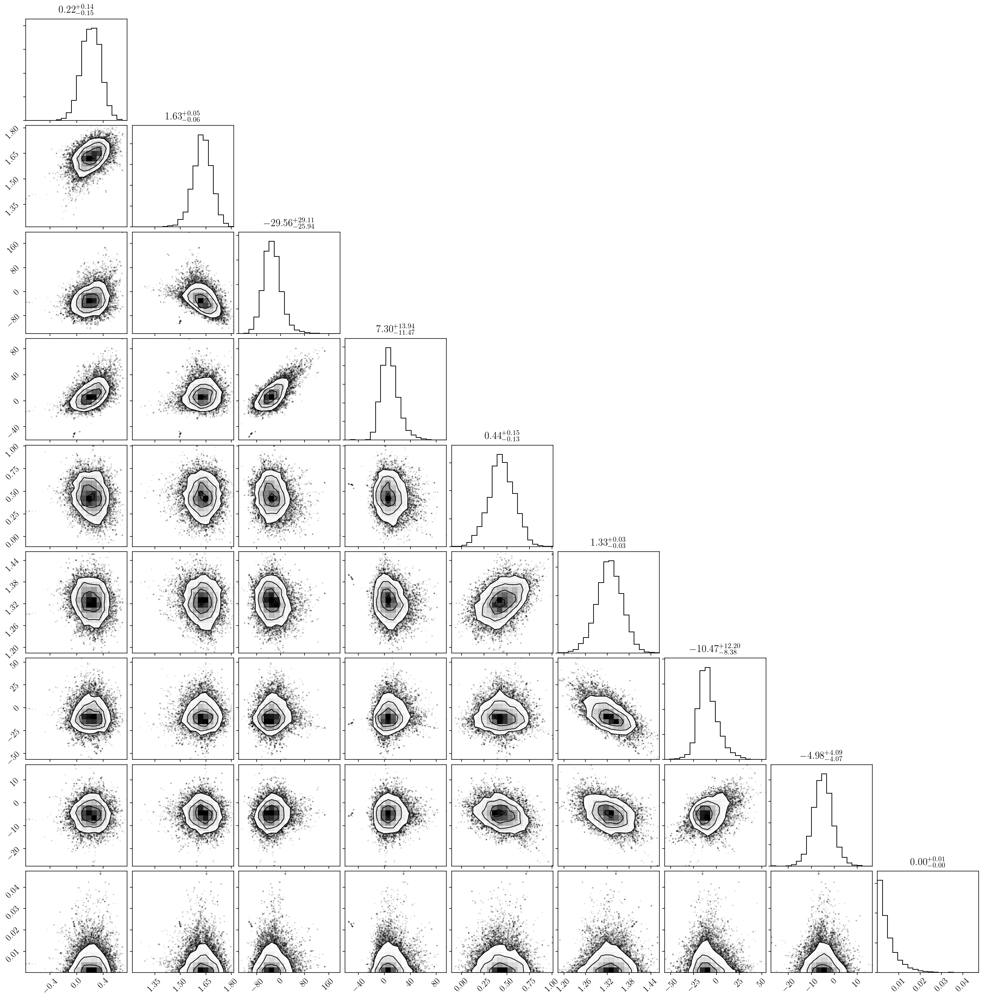

In [24]:
fig = corner.corner(lo_samples[2,3], show_titles=True)

In [26]:
10**np.median(lo_samples, axis=2)[2,3,5]

21.18998344924721

In [27]:
lo_par = np.empty([len(agebins)-1,len(fehbins)-1,9,3])
hi_par = np.empty([len(agebins)-1,len(fehbins)-1,9,3])
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        lo_par[i,j] = np.percentile(lo_samples[i,j], [16,50,84], axis=0).T
        hi_par[i,j] = np.percentile(hi_samples[i,j], [16,50,84], axis=0).T


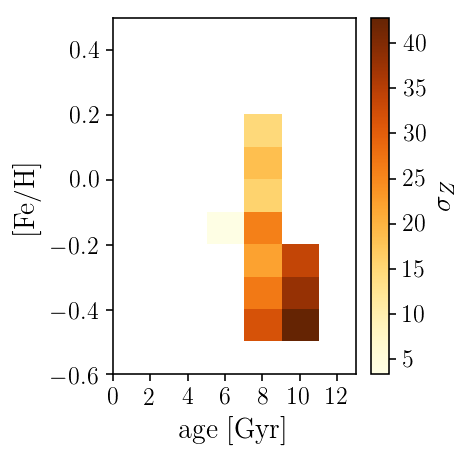

In [35]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(10**np.rot90(hi_par[:,:,5,1]), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

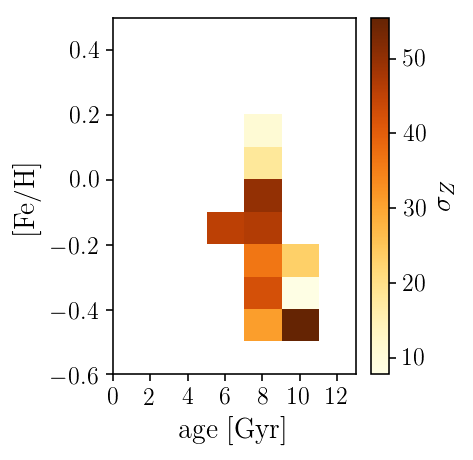

In [36]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(10**np.rot90(hi_par[:,:,1,1]), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

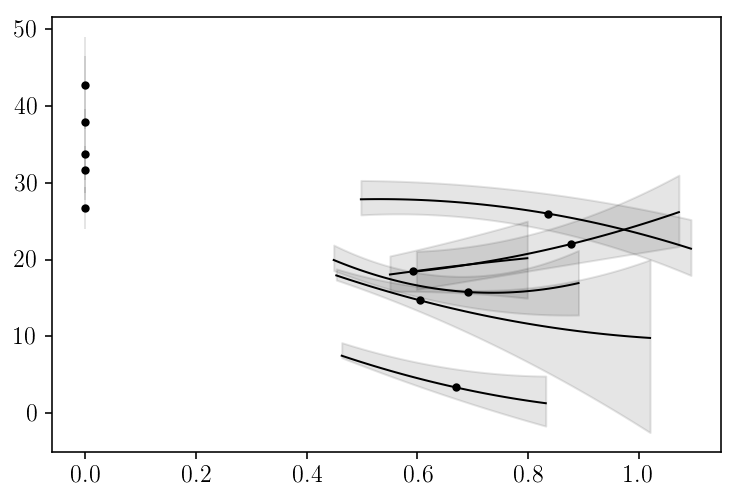

In [34]:
def sigma_profile(zs, a,b,c,med_z):
    prof = a*(zs-med_z)**2+b*(zs-med_z)+c
    return prof

def sigma_fz(par, i, j, med_z, sigmaR=False, returnprof=False, ax=None, color='Black'):
    zs = np.linspace(med_z[i,j][1], med_z[i,j][3], 50)
    if not sigmaR:
        a,b,c = par[i,j,6,1], par[i,j,7,1], 10**par[i,j,5,1]
        medianprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,6,0], par[i,j,7,0], 10**par[i,j,5,0]
        loprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,6,2], par[i,j,7,2], 10**par[i,j,5,2]
        hiprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        pind = 5
    else:
        a,b,c = par[i,j,2,1], par[i,j,3,1], 10**par[i,j,1,1]
        medianprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,2,0], par[i,j,3,0], 10**par[i,j,1,0]
        loprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,2,2], par[i,j,3,2], 10**par[i,j,1,2]
        hiprof = sigma_profile(zs, a, b, c, med_z[i,j,2])   
        pind = 1
    if returnprof:
        return zs, medianprof, loprof, hiprof
    if not ax == None:
        ax.plot(zs, medianprof, color=color)
        ax.fill_between(zs, loprof, hiprof, color=color, alpha=0.1)
        ax.scatter(med_z[i,j,2], 10**par[i,j,pind,1], color=color, s=10)
        return None
    plt.plot(zs, medianprof, color=color)
    plt.fill_between(zs, loprof, hiprof, color=color, alpha=0.1)
    plt.scatter(med_z[i,j,2], 10**par[i,j,pind,1], color=color, s=10)   
    

fig = plt.figure()

for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        sigma_fz(hi_par, i, j, lo_med_z, sigmaR=False)
        

In [ ]:
zs

In [7]:
nwalk=200
ncut=300
nit=500
threads = 16

agebins = np.arange(1.,14.,2.)
fehbins = np.arange(-0.6,0.6,0.1)
i,j=0,4

lo_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,11])
hi_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,11])
lo_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
hi_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
med_z_arrs = [lo_med_z, hi_med_z]
sample_arrs = [lo_samples, hi_samples]

lo_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbtgassample.alphaedge(dat['FE_H']))]
hi_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbtgassample.alphaedge(dat['FE_H']))]
masks = [lo_mask, hi_mask]
labs = ['low [a/Fe]', 'high [a/Fe]']
for ii,m in enumerate(masks):
    print(labs[ii])
    print(len(vRvTvz[:,0][m]))
    if len(vRvTvz[:,0][m]) < 100:
        print('not enough data here!')
        sample_arrs[ii][i,j] = np.ones([nwalk*nit-ncut*nwalk,11])*np.nan
        continue
    v_R = vRvTvz[:,0][m]*220.
    v_z = vRvTvz[:,2][m]*220.
    R = Rpz[:,0][m]*8.
    z = Rpz[:,2][m]*8.
    cov_vRvTvz = cov_galcencyl[m]
    med_z = np.nanmedian(np.fabs(z))
    med_z_arrs[ii][i,j] = np.nanpercentile(np.fabs(z), [10,25,50,75,90])
    init = [1/8.,np.log10(30.),0.,0.,1/2.5,np.log10(20.),0.,0.,0.,0.,0.01]
    out = fitDisp.fitDisp(R, z, v_R, v_z, cov_vRvTvz, med_z, 'ellipsoid', init, mcmc=True, threads=threads, ncut=ncut, nit=nit, nwalk=nwalk)
    sample_arrs[ii][i,j] = out[1]


low [a/Fe]
195
inital parameters: [0.125, 1.4771212547196624, 0.0, 0.0, 0.4, 1.3010299956639813, 0.0, 0.0, 0.0, 0.0, 0.01]
maximum likelihood params: [ 0.3260162   1.57160546 -0.91100322 -2.21557574 -0.16674669  1.15050877
  0.91522008  0.22961584 -0.0803287   2.12357941  0.00777823]


500it [01:51,  4.47it/s]

high [a/Fe]
9
not enough data here!


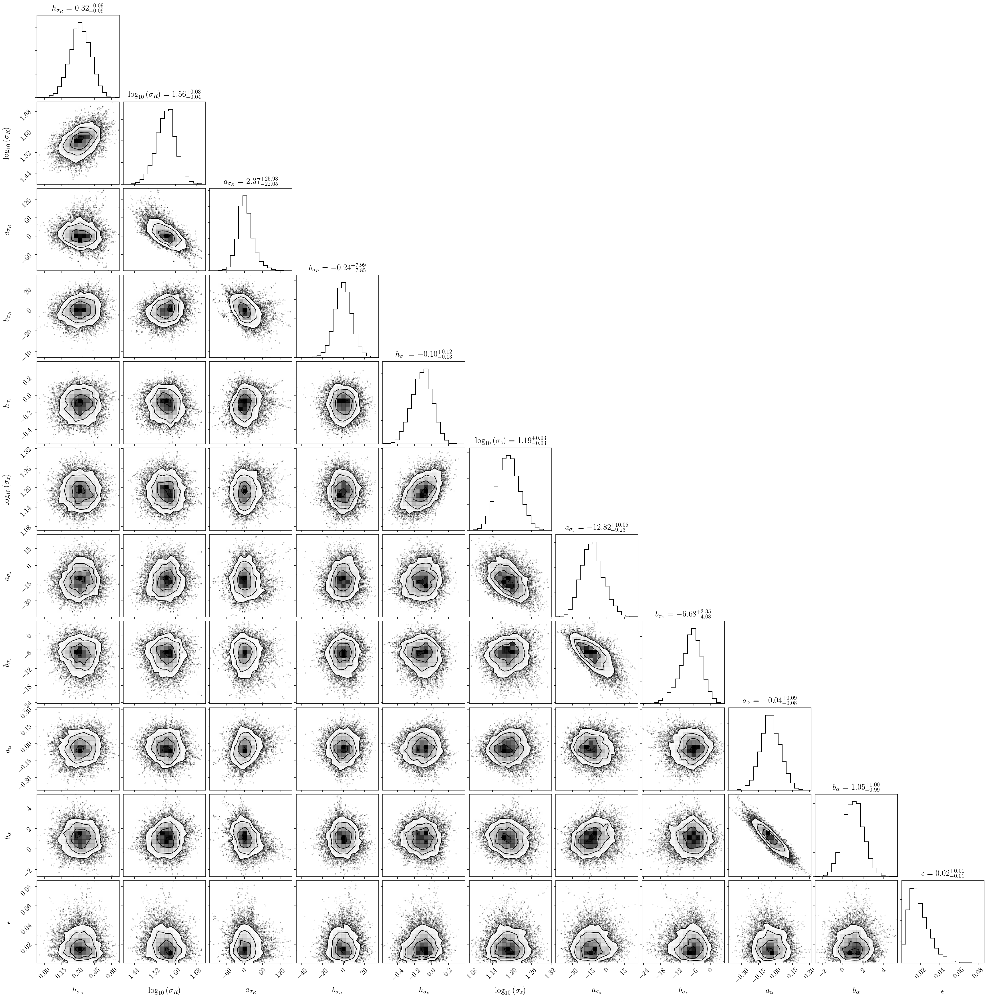

In [9]:
labels = [r'$h_{\sigma_{R}}$', 
          r'$\log_{10}{(\sigma_R)}$', 
          r'$a_{\sigma_R}$',
          r'$b_{\sigma_R}$',
          r'$h_{\sigma_z}$',
          r'$\log_{10}{(\sigma_z)}$',
          r'$a_{\sigma_z}$',
          r'$b_{\sigma_z}$',
          r'$a_{\alpha}$',
          r'$b_{\alpha}$',
          r'$\epsilon$']
fig = corner.corner(lo_samples[i,j], labels=labels, show_titles=True)

In [107]:
nwalk=100
ncut=300
nit=500
threads = 16

agebins = np.arange(1.,14.,2.)
fehbins = np.arange(-0.6,0.6,0.1)


if os.path.isfile('../sav/samples_monoage_ellipsoid.npy'):
    with open('../sav/samples_monoage_ellipsoid.npy', 'rb') as f:
        lo_samples = np.load(f)
        hi_samples = np.load(f)
        co_samples = np.load(f)
        lo_med_z = np.load(f)
        hi_med_z = np.load(f)
        co_med_z = np.load(f)
else:
    lo_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,11])
    hi_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,11])
    co_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,11])
    lo_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
    hi_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
    co_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
    med_z_arrs = [lo_med_z, hi_med_z, co_med_z]
    sample_arrs = [lo_samples, hi_samples, co_samples]
    for i in range(len(agebins)-1):
        for j in range(len(fehbins)-1):
            lo_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbtgassample.alphaedge(dat['FE_H']))]
            hi_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbtgassample.alphaedge(dat['FE_H']))]
            co_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]
            masks = [lo_mask, hi_mask, co_mask]
            labs = ['low [a/Fe]', 'high [a/Fe]', 'all [a/Fe]']
            for ii,m in enumerate(masks):
                print(labs[ii])
                print(len(vRvTvz[:,0][m]))
                if len(vRvTvz[:,0][m]) < 100:
                    print('not enough data here!')
                    sample_arrs[ii][i,j] = np.ones([nwalk*nit-ncut*nwalk,11])*np.nan
                    continue
                v_R = vRvTvz[:,0][m]*220.
                v_z = vRvTvz[:,2][m]*220.
                R = Rpz[:,0][m]*8.
                z = Rpz[:,2][m]*8.
                cov_vRvTvz = cov_galcencyl[m]
                med_z = np.nanmedian(np.fabs(z))
                med_z_arrs[ii][i,j] = np.nanpercentile(np.fabs(z), [10,25,50,75,90])
                init = [1/8.,np.log10(30.),0.,0.,1/2.5,np.log10(20.),0.,0.,0.,0.,0.01]
                out = fitDisp.fitDisp(R, z, v_R, v_z, cov_vRvTvz, med_z, 'ellipsoid', init, mcmc=True, threads=threads, ncut=ncut, nit=nit, nwalk=nwalk)
                sample_arrs[ii][i,j] = out[1]
    with open('../sav/samples_monoage_ellipsoid.npy', 'wb') as f:
        np.save(f, lo_samples)
        np.save(f, hi_samples)
        np.save(f, co_samples)
        np.save(f, lo_med_z)
        np.save(f, hi_med_z)
        np.save(f, co_med_z)

In [108]:
lo_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
hi_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
co_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
med_z_arrs = [lo_med_z, hi_med_z, co_med_z]
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        lo_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbtgassample.alphaedge(dat['FE_H']))]
        hi_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbtgassample.alphaedge(dat['FE_H']))]
        co_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]
        masks = [lo_mask, hi_mask, co_mask]
        for ii,m in enumerate(masks):
                if len(vRvTvz[:,0][m]) < 100:
                    med_z_arrs[ii][i,j] = np.ones(5)*np.nan
                    continue
                v_R = vRvTvz[:,0][m]*220.
                v_z = vRvTvz[:,2][m]*220.
                R = Rpz[:,0][m]*8.
                z = Rpz[:,2][m]*8.
                cov_vRvTvz = cov_galcencyl[m]
                med_z = np.nanmedian(np.fabs(z))
                med_z_arrs[ii][i,j] = np.nanpercentile(np.fabs(z), [10,25,50,75,90])

In [109]:
lo_par = np.empty([len(agebins)-1,len(fehbins)-1,11,3])
hi_par = np.empty([len(agebins)-1,len(fehbins)-1,11,3])
co_par = np.empty([len(agebins)-1,len(fehbins)-1,11,3])
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        lo_par[i,j] = np.nanpercentile(lo_samples[i,j], [16,50,84], axis=0).T
        hi_par[i,j] = np.nanpercentile(hi_samples[i,j], [16,50,84], axis=0).T
        co_par[i,j] = np.nanpercentile(co_samples[i,j], [16,50,84], axis=0).T


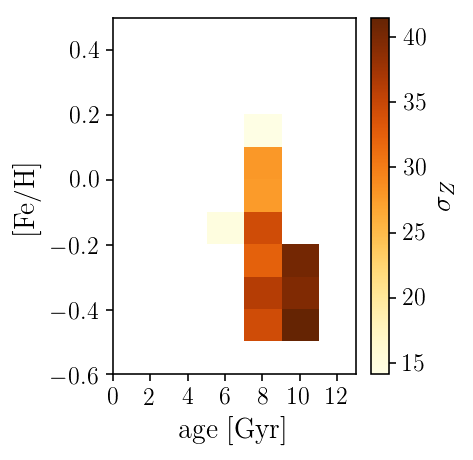

In [110]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(10**np.rot90(hi_par[:,:,5,1]), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

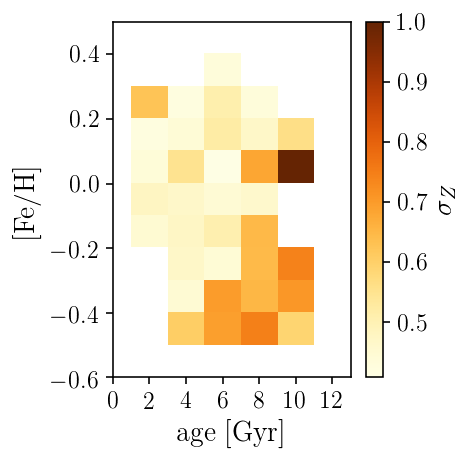

In [111]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(np.rot90(10**co_par[:,:,5,1]/10**co_par[:,:,1,1]), extent=extent, aspect='auto', cmap=cm_heat, vmax=1.)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

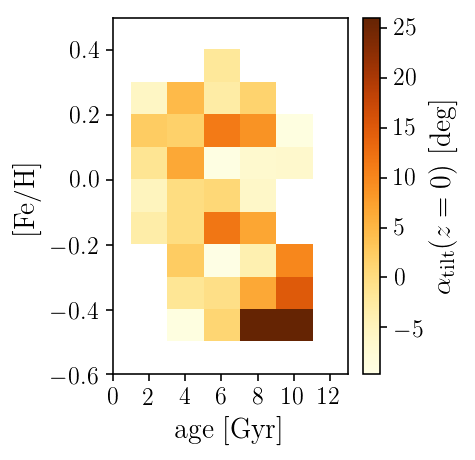

In [112]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(np.rot90(np.arctan(co_par[:,:,8,1])*180./np.pi), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\alpha_{\mathrm{tilt}}(z=0)\ \mathrm{[deg]}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

Text(0,0.5,'$\\sigma_{z}\\ \\mathrm{[km\\ s^{-1}]}$')

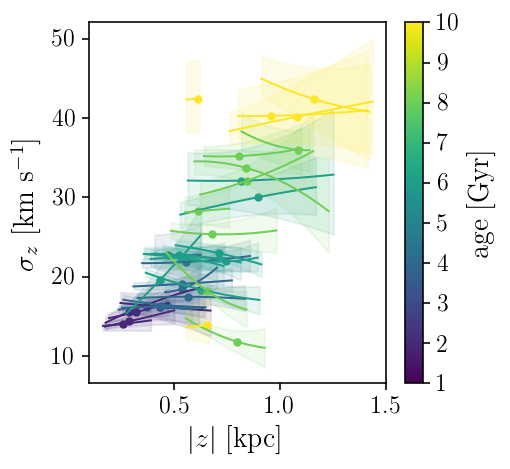

In [120]:
agegrid = (np.ones([len(agebins)-1, len(fehbins)-1]).T*((agebins[1:]+agebins[:-1])/2.)).T
fehgrid = (np.ones([len(agebins)-1, len(fehbins)-1])*((fehbins[1:]+fehbins[:-1])/2.))


def sigma_profile(zs, a,b,c,med_z):
    prof = a*(zs-med_z)**2+b*(zs-med_z)+c
    return prof

def sigma_fz(par, i, j, med_z, sigmaR=False, returnprof=False, ax=None, color='Black'):
    zs = np.linspace(med_z[i,j][1], med_z[i,j][3], 50)
    if not sigmaR:
        a,b,c = par[i,j,6,1], par[i,j,7,1], 10**par[i,j,5,1]
        medianprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,6,0], par[i,j,7,0], 10**par[i,j,5,0]
        loprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,6,2], par[i,j,7,2], 10**par[i,j,5,2]
        hiprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        pind = 5
    else:
        a,b,c = par[i,j,2,1], par[i,j,3,1], 10**par[i,j,1,1]
        medianprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,2,0], par[i,j,3,0], 10**par[i,j,1,0]
        loprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,2,2], par[i,j,3,2], 10**par[i,j,1,2]
        hiprof = sigma_profile(zs, a, b, c, med_z[i,j,2])   
        pind = 1
    if returnprof:
        return zs, medianprof, loprof, hiprof
    if not ax == None:
        ax.plot(zs, medianprof, color=color)
        ax.fill_between(zs, loprof, hiprof, color=color, alpha=0.1)
        ax.scatter(med_z[i,j,2], 10**par[i,j,pind,1], color=color, s=10)
        return None
    plt.plot(zs, medianprof, color=color)
    plt.fill_between(zs, loprof, hiprof, color=color, alpha=0.1)
    plt.scatter(med_z[i,j,2], 10**par[i,j,pind,1], color=color, s=10) 
    
norm = matplotlib.colors.Normalize(
    vmin=1.,
    vmax=10.)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=c_m, norm=norm)
s_m.set_array([])   

fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        sigma_fz(co_par, i, j, co_med_z, sigmaR=False, color=s_m.to_rgba(agegrid[i,j]))

plt.colorbar(s_m, label=r'$\mathrm{age\ [Gyr]}$')
plt.xlabel(r'$|z|\ \mathrm{[kpc]}$')
plt.ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')

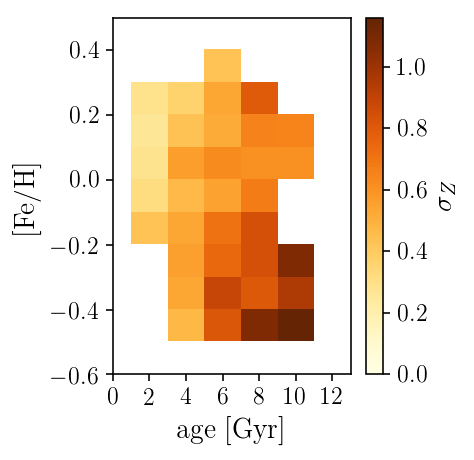

In [88]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(np.rot90(co_med_z[:,:,2]), extent=extent, aspect='auto', cmap=cm_heat, vmin=0.)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

Text(0.5,0,'$\\mathrm{age\\ [Gyr]}$')

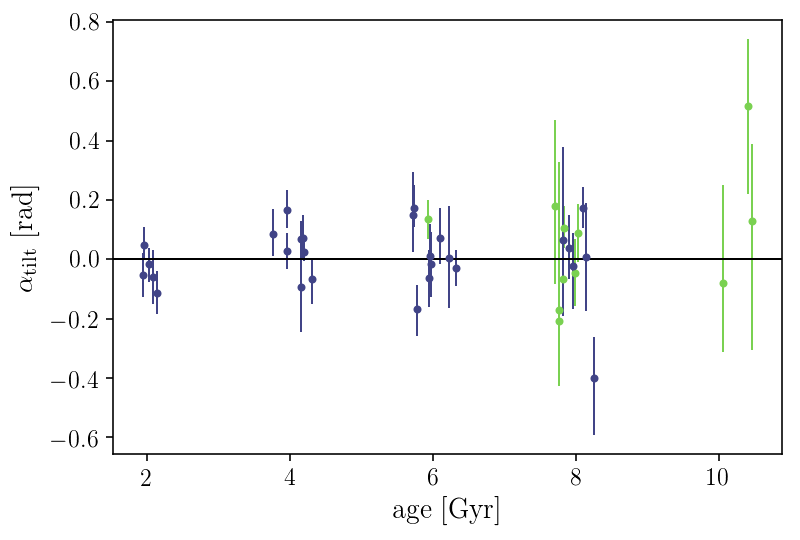

In [89]:
yerr = np.dstack([hi_par[:,:,8,1].ravel()-hi_par[:,:,8,0].ravel(), hi_par[:,:,8,2].ravel()-hi_par[:,:,8,1].ravel()])[0].T
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), hi_par[:,:,8,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.8))
yerr = np.dstack([lo_par[:,:,8,1].ravel()-lo_par[:,:,8,0].ravel(), lo_par[:,:,8,2].ravel()-lo_par[:,:,8,1].ravel()])[0].T
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), lo_par[:,:,8,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.2))

plt.axhline(0., c='Black')
plt.ylabel(r'$\alpha_{\mathrm{tilt}}\ \mathrm{[rad]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')

Text(0.5,0,'$\\mathrm{age\\ [Gyr]}$')

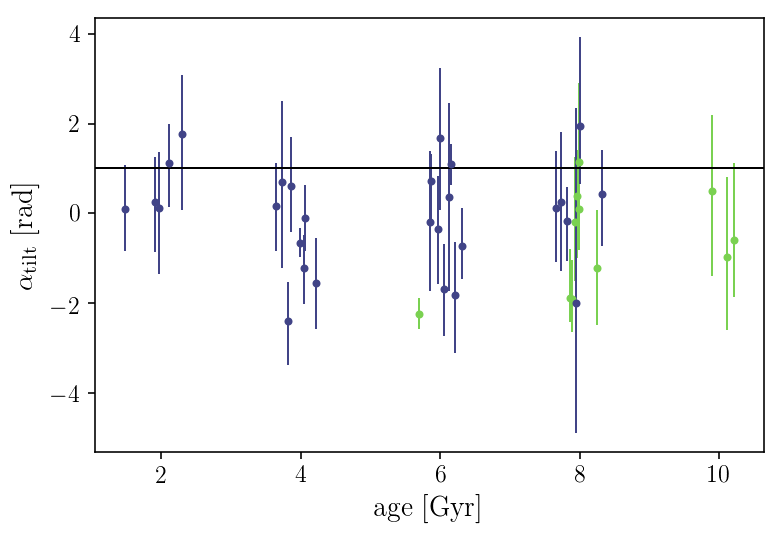

In [90]:
yerr = np.dstack([hi_par[:,:,9,1].ravel()-hi_par[:,:,9,0].ravel(), hi_par[:,:,9,2].ravel()-hi_par[:,:,9,1].ravel()])[0].T
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), hi_par[:,:,9,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.8))
yerr = np.dstack([lo_par[:,:,9,1].ravel()-lo_par[:,:,9,0].ravel(), lo_par[:,:,9,2].ravel()-lo_par[:,:,9,1].ravel()])[0].T
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), lo_par[:,:,9,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.2))

plt.axhline(1., c='Black')
plt.ylabel(r'$\alpha_{\mathrm{tilt}}\ \mathrm{[rad]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')

Text(0.5,0,'$\\mathrm{age\\ [Gyr]}$')

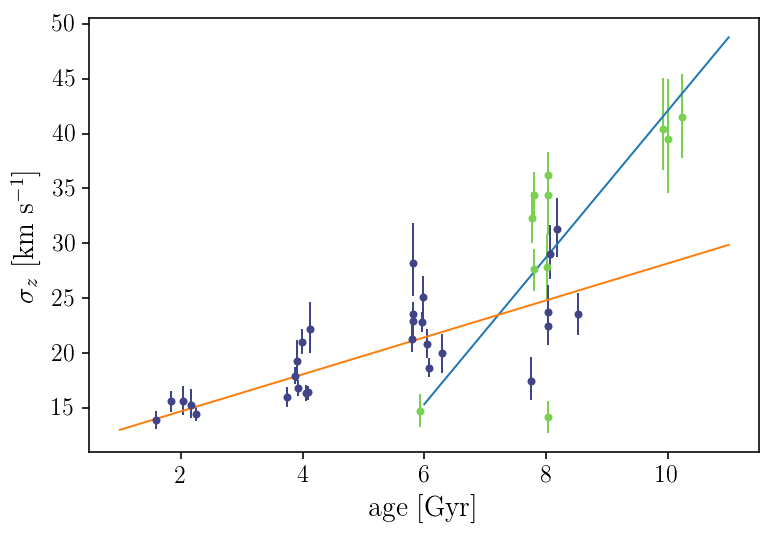

In [91]:
def lnlike(theta, x, y, yerr):
    m, b, lnf = theta
    model = m * x + b
    inv_sigma2 = 1.0/(yerr**2 + model**2*np.exp(2*lnf))
    return -0.5*(np.nansum((y-model)**2*inv_sigma2 - np.log(inv_sigma2)))

import scipy.optimize as op
nll = lambda *args: -lnlike(*args)

yerr = np.dstack([10**hi_par[:,:,5,1].ravel()-10**hi_par[:,:,5,0].ravel(), 10**hi_par[:,:,5,2].ravel()-10**hi_par[:,:,5,1].ravel()])[0].T
x = agegrid.ravel()
y = 10**hi_par[:,:,5,1].ravel()
result = op.minimize(nll, [0.1, 0, np.log(0.8)], args=(x, y, yerr))
m_ml, b_ml, lnf_ml = result["x"]
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), 10**hi_par[:,:,5,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.8))
xs = np.linspace(6.,11.,10)
plt.plot(xs, m_ml*xs+b_ml)
yerr = np.dstack([10**lo_par[:,:,5,1].ravel()-10**lo_par[:,:,5,0].ravel(), 10**lo_par[:,:,5,2].ravel()-10**lo_par[:,:,5,1].ravel()])[0].T
x = agegrid.ravel()
y = 10**lo_par[:,:,5,1].ravel()
result = op.minimize(nll, [0.1, 0, np.log(0.8)], args=(x, y, yerr))
m_ml, b_ml, lnf_ml = result["x"]
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), 10**lo_par[:,:,5,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.2))
xs = np.linspace(1.,11.,10)
plt.plot(xs, m_ml*xs+b_ml)

plt.ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')

Text(0.5,0,'$\\mathrm{age\\ [Gyr]}$')

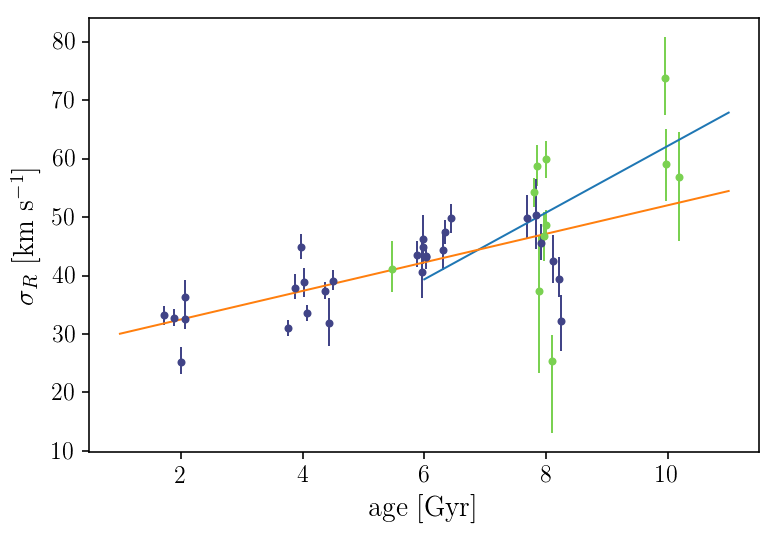

In [32]:
yerr = np.dstack([10**hi_par[:,:,1,1].ravel()-10**hi_par[:,:,1,0].ravel(), 10**hi_par[:,:,1,2].ravel()-10**hi_par[:,:,1,1].ravel()])[0].T
x = agegrid.ravel()
y = 10**hi_par[:,:,1,1].ravel()
result = op.minimize(nll, [0.1, 0, np.log(0.8)], args=(x, y, yerr))
m_ml, b_ml, lnf_ml = result["x"]
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), 10**hi_par[:,:,1,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.8))
xs = np.linspace(6.,11.,10)
plt.plot(xs, m_ml*xs+b_ml)
yerr = np.dstack([10**lo_par[:,:,1,1].ravel()-10**lo_par[:,:,1,0].ravel(), 10**lo_par[:,:,1,2].ravel()-10**lo_par[:,:,1,1].ravel()])[0].T
x = agegrid.ravel()
y = 10**lo_par[:,:,1,1].ravel()
result = op.minimize(nll, [0.1, 0, np.log(0.8)], args=(x, y, yerr))
m_ml, b_ml, lnf_ml = result["x"]
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), 10**lo_par[:,:,1,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.2))
xs = np.linspace(1.,11.,10)
plt.plot(xs, m_ml*xs+b_ml)

plt.ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')

Text(0.5,0,'$\\mathrm{age\\ [Gyr]}$')

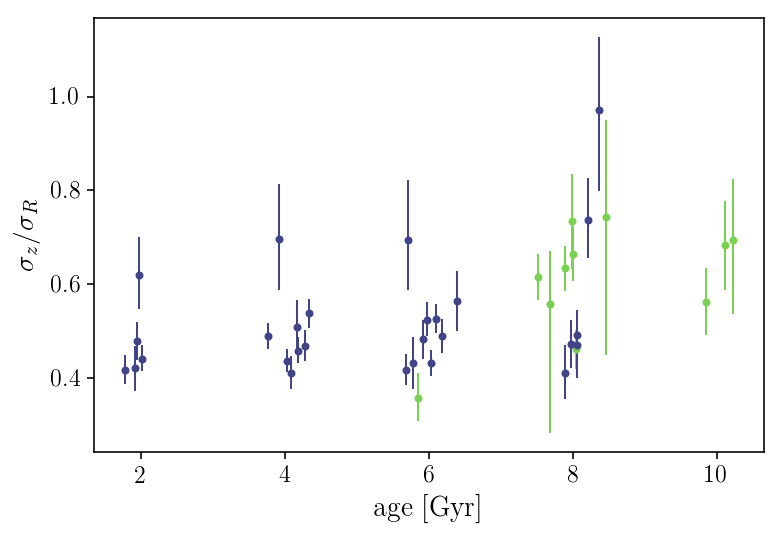

In [33]:
yerr = np.dstack([10**hi_par[:,:,1,0].ravel()-10**hi_par[:,:,1,1].ravel(), 10**hi_par[:,:,1,2].ravel()-10**hi_par[:,:,1,1].ravel()])[0].T
yerr_1 = np.dstack([10**hi_par[:,:,5,0].ravel()-10**hi_par[:,:,5,1].ravel(), 10**hi_par[:,:,5,0].ravel()-10**hi_par[:,:,5,1].ravel()])[0].T
hi_val = 10**hi_par[:,:,5,1].ravel()/10**hi_par[:,:,1,1].ravel()
hi_yerr = hi_val*np.sqrt((yerr/10**hi_par[:,:,1,1].ravel())**2+(yerr_1/10**hi_par[:,:,5,1].ravel())**2)
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), hi_val, yerr=hi_yerr, fmt='.', c=plt.cm.viridis(0.8))
yerr = np.dstack([10**lo_par[:,:,1,0].ravel()-10**lo_par[:,:,1,1].ravel(), 10**lo_par[:,:,1,2].ravel()-10**lo_par[:,:,1,1].ravel()])[0].T
yerr_1 = np.dstack([10**lo_par[:,:,5,0].ravel()-10**lo_par[:,:,5,1].ravel(), 10**lo_par[:,:,5,0].ravel()-10**lo_par[:,:,5,1].ravel()])[0].T
lo_val = 10**lo_par[:,:,5,1].ravel()/10**lo_par[:,:,1,1].ravel()
lo_yerr = lo_val*np.sqrt((yerr/10**lo_par[:,:,1,1].ravel())**2+(yerr_1/10**lo_par[:,:,5,1].ravel())**2)
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), lo_val, yerr=lo_yerr, fmt='.', c=plt.cm.viridis(0.2))


plt.ylabel(r'$\sigma_{z}/\sigma_{R}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')

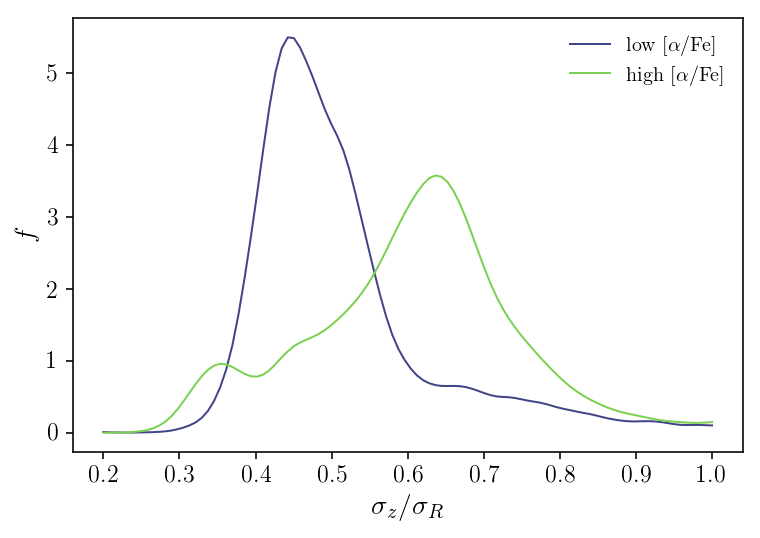

In [34]:
px = np.linspace(0.2,1.,100)

vals = 10**lo_samples[:,:,:,5].ravel()/10**lo_samples[:,:,:,1].ravel()
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.2), label=r'$\mathrm{low\ [\alpha/Fe]}$')

vals = 10**hi_samples[:,:,:,5].ravel()/10**hi_samples[:,:,:,1].ravel()
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.8), label=r'$\mathrm{high\ [\alpha/Fe]}$')

plt.xlabel(r'$\sigma_{z}/\sigma_{R}$')
plt.ylabel(r'$f$')
plt.legend(frameon=False, loc=1)

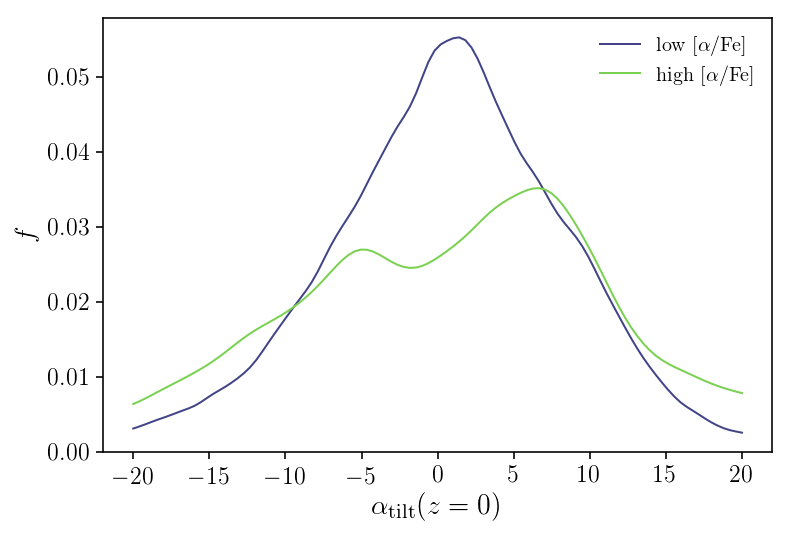

In [35]:
px = np.linspace(-20.,20.,100)

vals = np.arctan(lo_samples[:,:,:,8].ravel())*180./np.pi
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.2), label=r'$\mathrm{low\ [\alpha/Fe]}$')

vals = np.arctan(hi_samples[:,:,:,8].ravel())*180./np.pi
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.8), label=r'$\mathrm{high\ [\alpha/Fe]}$')

plt.xlabel(r'$\alpha_{\mathrm{tilt}}(z=0)$')
plt.ylabel(r'$f$')
plt.legend(frameon=False, loc=1)

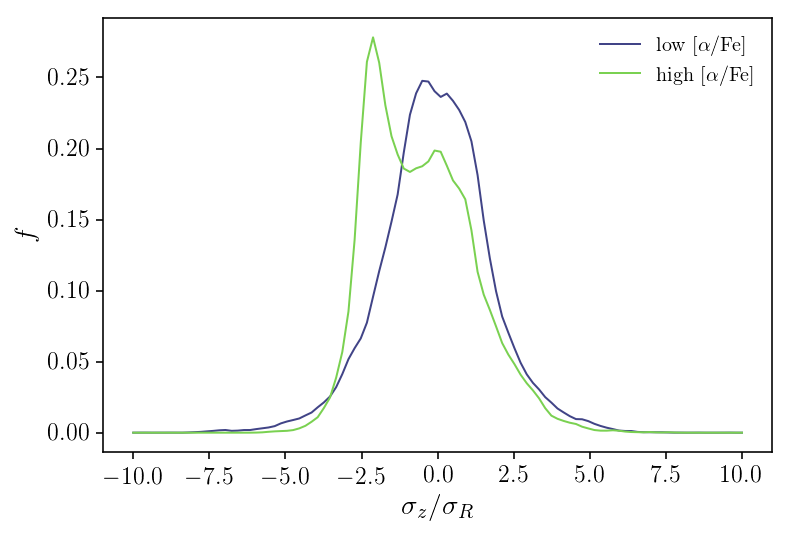

In [36]:
px = np.linspace(-10.,10.,100)

vals = lo_samples[:,:,:,9].ravel()
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.2), label=r'$\mathrm{low\ [\alpha/Fe]}$')

vals = hi_samples[:,:,:,9].ravel()
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.8), label=r'$\mathrm{high\ [\alpha/Fe]}$')

plt.xlabel(r'$\sigma_{z}/\sigma_{R}$')
plt.ylabel(r'$f$')
plt.legend(frameon=False, loc=1)

In [38]:
np.nanstd(lo_samples[:,:,:,9].ravel())

1.7631724593302631

In [39]:
nwalk=100
nit=500
ncut=300
threads = 32

agebins = np.arange(-0.1,0.35,0.05)
fehbins = np.arange(-0.6,0.6,0.1)

model_type = 'ellipsoid'

with open('../sav/samples_monoabundance_ellipsoid.npy', 'rb') as f:
    samples = np.load(f)
    med_zs = np.load(f)

In [40]:
params = np.empty([len(agebins)-1,len(fehbins)-1,11,3])
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        params[i,j] = np.percentile(samples[i,j], [16,50,84], axis=0).T



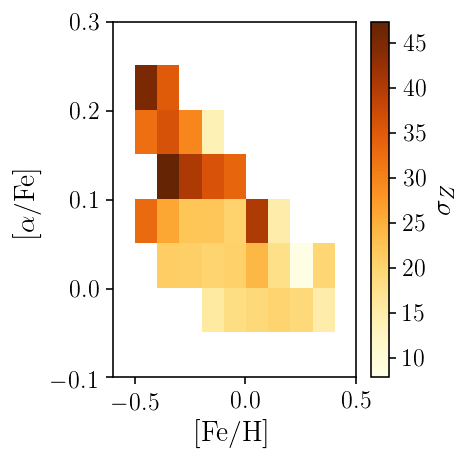

In [41]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [fehbins[0], fehbins[-1], agebins[0], agebins[-1]]
s0 = plt.imshow(10**params[:,:,5,1][::-1], extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[\alpha/Fe]}$')
plt.xlabel(r'$\mathrm{[Fe/H]}$')
fig.tight_layout()

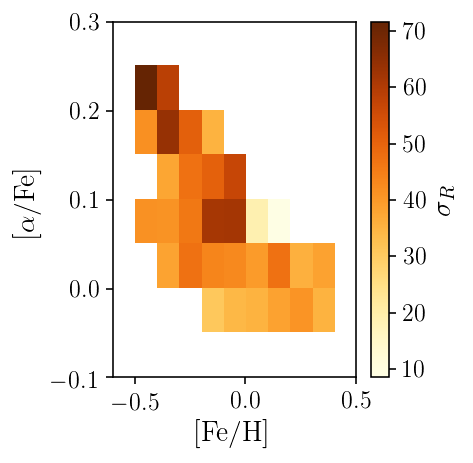

In [42]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [fehbins[0], fehbins[-1], agebins[0], agebins[-1]]
s0 = plt.imshow(10**params[:,:,1,1][::-1], extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{R}$')
plt.ylabel(r'$\mathrm{[\alpha/Fe]}$')
plt.xlabel(r'$\mathrm{[Fe/H]}$')
fig.tight_layout()

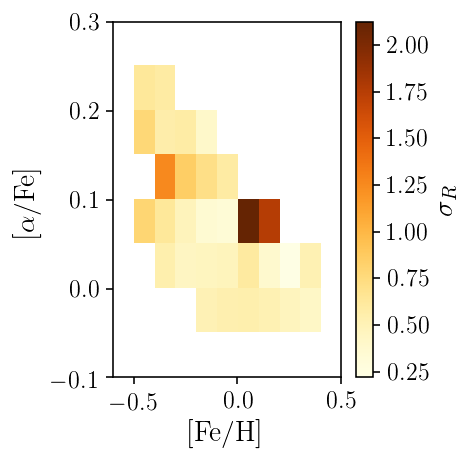

In [43]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [fehbins[0], fehbins[-1], agebins[0], agebins[-1]]
s0 = plt.imshow(10**params[:,:,5,1][::-1]/10**params[:,:,1,1][::-1], extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{R}$')
plt.ylabel(r'$\mathrm{[\alpha/Fe]}$')
plt.xlabel(r'$\mathrm{[Fe/H]}$')
fig.tight_layout()

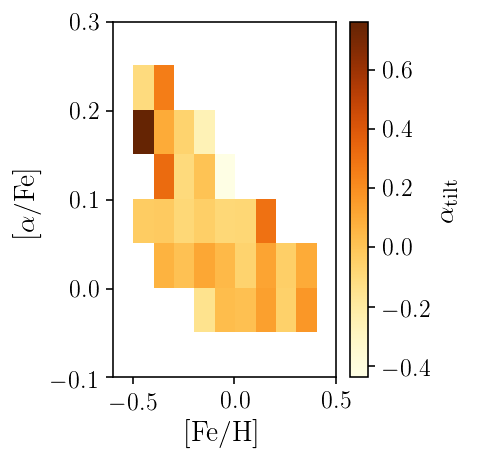

In [44]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [fehbins[0], fehbins[-1], agebins[0], agebins[-1]]
s0 = plt.imshow(params[:,:,8,1][::-1], extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\alpha_{\mathrm{tilt}}$')
plt.ylabel(r'$\mathrm{[\alpha/Fe]}$')
plt.xlabel(r'$\mathrm{[Fe/H]}$')
fig.tight_layout()

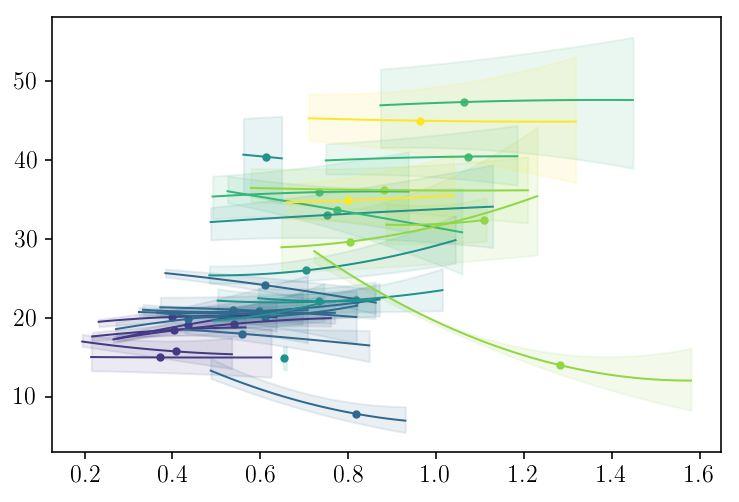

In [45]:
agegrid = (np.ones([len(agebins)-1, len(fehbins)-1]).T*((agebins[1:]+agebins[:-1])/2.)).T
fehgrid = (np.ones([len(agebins)-1, len(fehbins)-1])*((fehbins[1:]+fehbins[:-1])/2.))


def sigma_profile(zs, a,b,c,med_z):
    prof = a*(zs-med_z)**2+b*(zs-med_z)+c
    return prof

def sigma_fz(par, i, j, med_z, sigmaR=False, returnprof=False, ax=None, color='Black'):
    zs = np.linspace(med_z[i,j][1], med_z[i,j][3], 50)
    if not sigmaR:
        a,b,c = par[i,j,6,1], par[i,j,7,1], 10**par[i,j,5,1]
        medianprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,6,0], par[i,j,7,0], 10**par[i,j,5,0]
        loprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,6,2], par[i,j,7,2], 10**par[i,j,5,2]
        hiprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        pind = 5
    else:
        a,b,c = par[i,j,2,1], par[i,j,3,1], 10**par[i,j,1,1]
        medianprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,2,0], par[i,j,3,0], 10**par[i,j,1,0]
        loprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,2,2], par[i,j,3,2], 10**par[i,j,1,2]
        hiprof = sigma_profile(zs, a, b, c, med_z[i,j,2])   
        pind = 1
    if returnprof:
        return zs, medianprof, loprof, hiprof
    if not ax == None:
        ax.plot(zs, medianprof, color=color)
        ax.fill_between(zs, loprof, hiprof, color=color, alpha=0.1)
        ax.scatter(med_z[i,j,2], 10**par[i,j,pind,1], color=color, s=10)
        return None
    plt.plot(zs, medianprof, color=color)
    plt.fill_between(zs, loprof, hiprof, color=color, alpha=0.1)
    plt.scatter(med_z[i,j,2], 10**par[i,j,pind,1], color=color, s=10)   
    

fig = plt.figure()

for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        sigma_fz(params, i, j, med_zs, sigmaR=False, color=plt.cm.viridis((agegrid[i,j]+0.075)/0.3))
     

Text(0.5,0,'$\\mathrm{[\\alpha/Fe]}$')

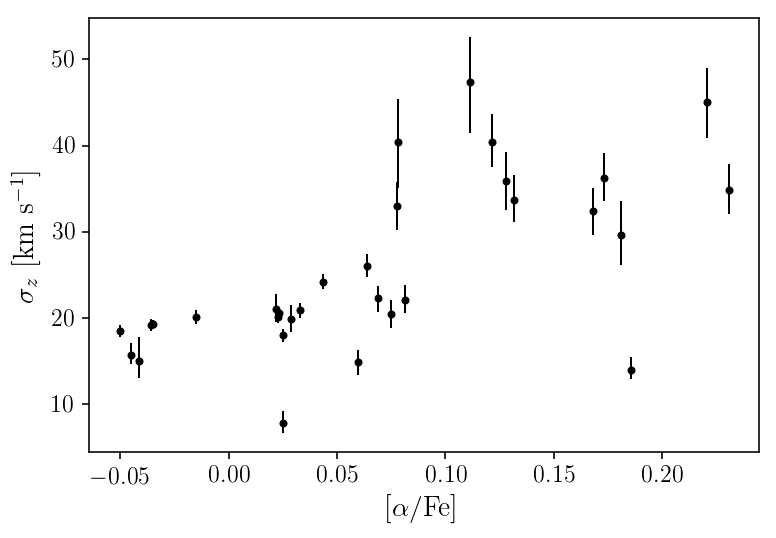

In [10]:
yerr = np.dstack([10**params[:,:,5,1].ravel()-10**params[:,:,5,0].ravel(), 10**params[:,:,5,2].ravel()-10**params[:,:,5,1].ravel()])[0].T
plt.errorbar(agegrid.ravel()+0.01*np.random.randn(len(agegrid.ravel())), 10**params[:,:,5,1].ravel(), yerr=yerr, fmt='.', c='Black')


plt.ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
plt.xlabel(r'$\mathrm{[\alpha/Fe]}$')

Text(0.5,0,'$\\mathrm{[\\alpha/Fe]}$')

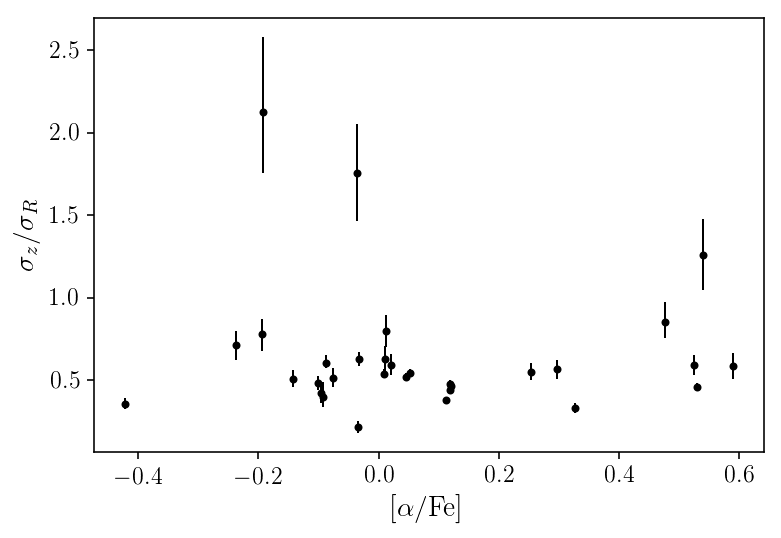

In [12]:
yerr = np.dstack([10**params[:,:,1,0].ravel()-10**params[:,:,1,1].ravel(), 10**params[:,:,1,2].ravel()-10**params[:,:,1,1].ravel()])[0].T
yerr_1 = np.dstack([10**params[:,:,5,0].ravel()-10**params[:,:,5,1].ravel(), 10**params[:,:,5,0].ravel()-10**params[:,:,5,1].ravel()])[0].T
hi_val = 10**params[:,:,5,1].ravel()/10**params[:,:,1,1].ravel()
hi_yerr = hi_val*np.sqrt((yerr/10**params[:,:,1,1].ravel())**2+(yerr_1/10**params[:,:,5,1].ravel())**2)
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), hi_val, yerr=hi_yerr, fmt='.', c='Black')


plt.ylabel(r'$\sigma_{z}/\sigma_{R}$')
plt.xlabel(r'$\mathrm{[\alpha/Fe]}$')

Text(0,0.5,'$f$')

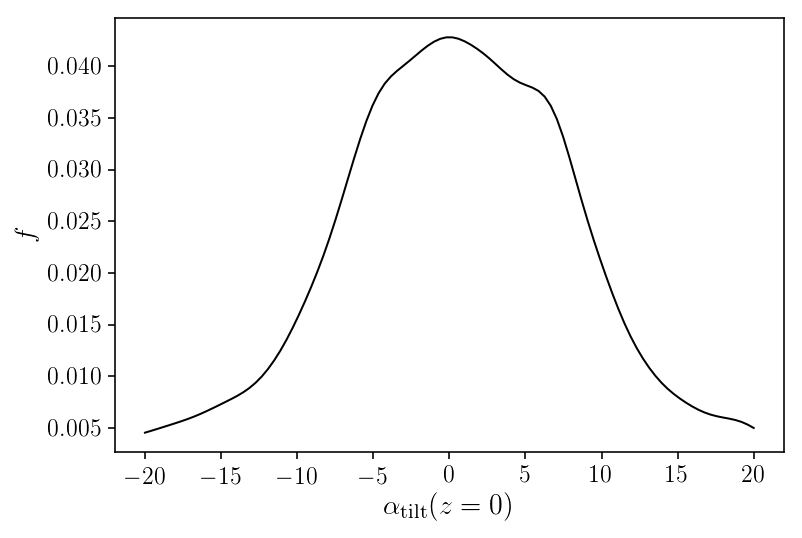

In [46]:
px = np.linspace(-20.,20.,100)

vals = np.arctan(samples[:,:,:,8].ravel())*180./np.pi
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color='Black')

plt.xlabel(r'$\alpha_{\mathrm{tilt}}(z=0)$')
plt.ylabel(r'$f$')


Text(0,0.5,'$f$')

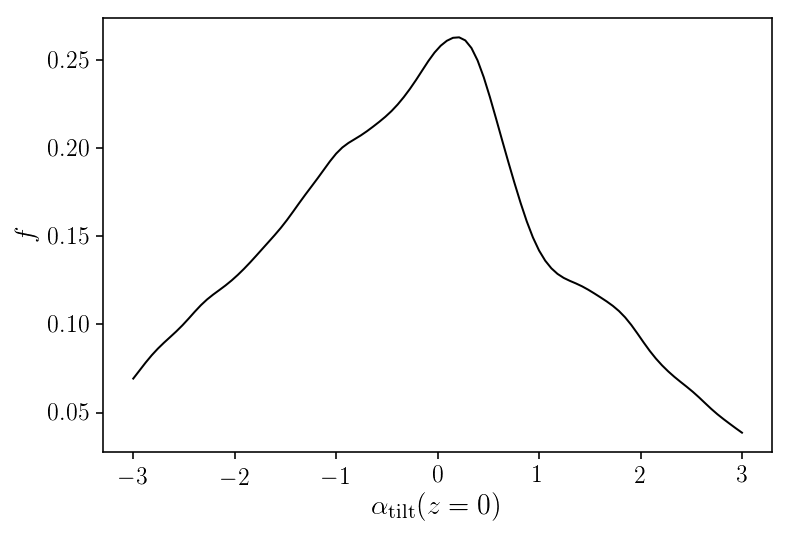

In [51]:
px = np.linspace(-3.,3.,100)

vals = samples[:,:,:,9].ravel()
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color='Black')

plt.xlabel(r'$\alpha_{\mathrm{tilt}}(z=0)$')
plt.ylabel(r'$f$')



Optimization terminated successfully.
         Current function value: 6858.956188
         Iterations: 2
         Function evaluations: 30
         Gradient evaluations: 6
         Current function value: 19755.090265
         Iterations: 1
         Function evaluations: 276
         Gradient evaluations: 53


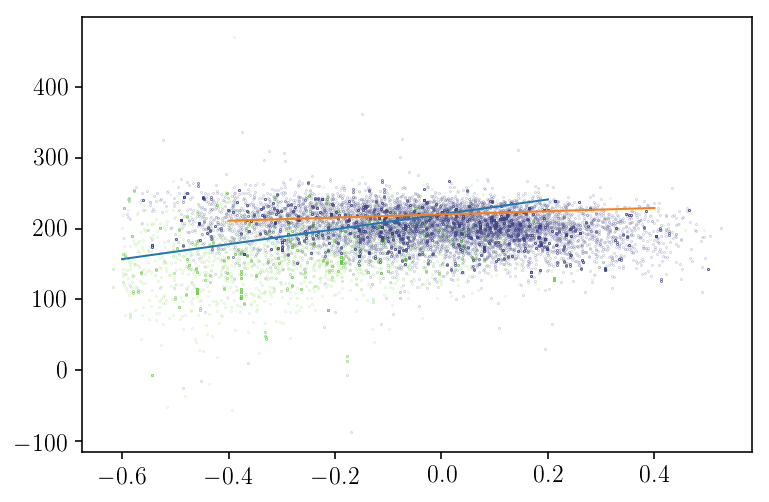

In [11]:
def lnlike(theta, x, y, yerr):
    m, b, lnf = theta
    model = m * x + b
    inv_sigma2 = 1.0/(yerr**2 + model**2*np.exp(2*lnf))
    return -0.5*(np.nansum((y-model)**2*inv_sigma2 - np.log(inv_sigma2)))

import scipy.optimize as op
nll = lambda *args: -lnlike(*args)

himask = dat['AVG_ALPHAFE'] > define_rgbtgassample.alphaedge(dat['FE_H'])
lomask = dat['AVG_ALPHAFE'] <= define_rgbtgassample.alphaedge(dat['FE_H'])
yerr = np.sqrt(cov_galcencyl[:,1,1][himask])
x = dat['FE_H'][himask]
y = vRvTvz[:,1][himask]
result = op.minimize(nll, [0.1, 1., np.log(0.8)], args=(x, y, yerr),options={'disp':True})
m_ml, b_ml, lnf_ml = result["x"]
plt.scatter(dat['FE_H'][himask], vRvTvz[:,1][himask]*220., s=0.01, c=plt.cm.viridis(0.8))
xs = np.linspace(-0.6,0.2,100)
plt.plot(xs, 220*(m_ml*xs+b_ml))
yerr = np.sqrt(cov_galcencyl[:,1,1][lomask])
x = dat['FE_H'][lomask]
y = vRvTvz[:,1][lomask]
result = op.minimize(nll, [0.1, 1., np.log(0.8)], args=(x, y, yerr),options={'disp':True})
m_ml, b_ml, lnf_ml = result["x"]
plt.scatter(dat['FE_H'][lomask], vRvTvz[:,1][lomask]*220., s=0.01, c=plt.cm.viridis(0.2))
xs = np.linspace(-0.4,0.4,100)
plt.plot(xs, 220*(m_ml*xs+b_ml))


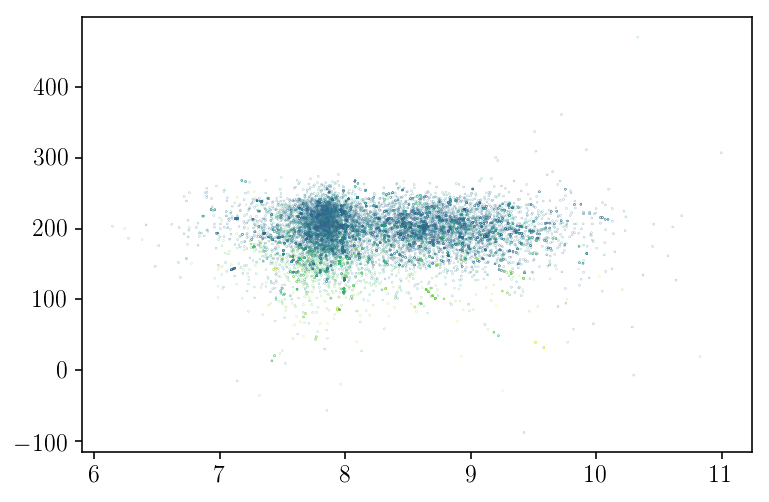

In [48]:
plt.scatter(Rpz[:,0]*8., vRvTvz[:,1]*220., s=0.01, c=dat['AVG_ALPHAFE'])

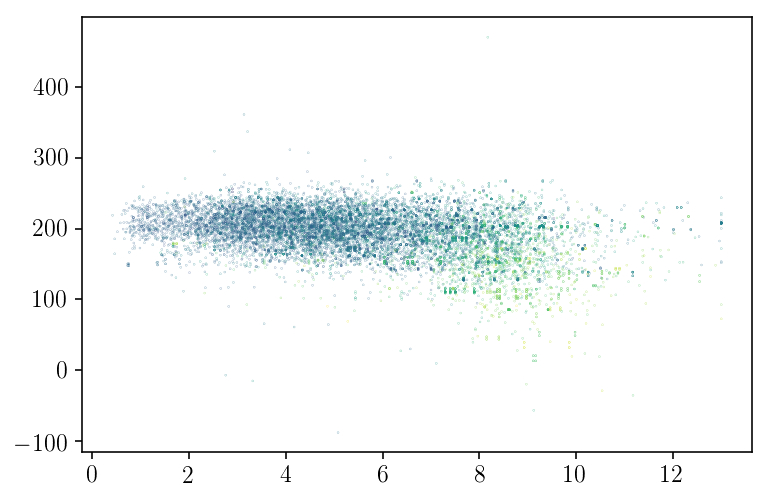

In [49]:
plt.scatter(dat['Age'], vRvTvz[:,1]*220., s=0.01, c=dat['AVG_ALPHAFE'])

(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 1.000e+00, 0.000e+00,
        1.000e+00, 1.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 1.000e+00,
        4.000e+00, 7.000e+00, 2.000e+00, 5.000e+00, 6.000e+00, 6.000e+00,
        1.000e+01, 6.000e+00, 4.000e+00, 8.000e+00, 4.000e+00, 1.100e+01,
        2.100e+01, 4.600e+01, 2.700e+01, 4.800e+01, 5.500e+01, 1.490e+02,
        1.100e+02, 5.100e+01, 1.290e+02, 1.250e+02, 2.070e+02, 1.990e+02,
        3.290e+02, 3.930e+02, 4.500e+02, 4.680e+02, 6.310e+02, 5.890e+02,
        7.740e+02, 9.950e+02, 1.059e+03, 1.135e+03, 1.539e+03, 1.017e+03,
        9.440e+02, 1.161e+03, 8.220e+02, 5.410e+02, 3.900e+02, 2.590e+02,
        1.090e+02, 7.200e+01, 3.800e+01, 3.600e+01, 5.000e+00, 2.000e+00,
        1.000e+00, 0.000e+00, 1.000e+00, 1.000e+00, 1.000e+00, 2.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 1.000e+0

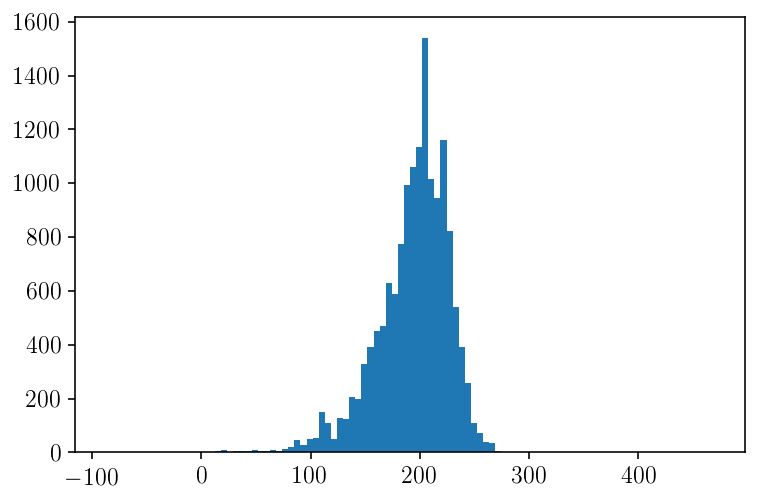

In [57]:
plt.hist(vRvTvz[:,1]*220., bins=100)

In [22]:
cov_galcencyl[:,1,1]

array([  5.46623151,  14.84134556,  15.63814159, ...,  28.03792759,
         9.55522776, 127.49769941])

In [2]:
if os.path.isfile('../sav/DR14_TGAS_correctedAges_galcencyl.npy'):
    with open('../sav/DR14_TGAS_correctedAges_galcencyl.npy', 'rb') as f:
        dat = np.load(f)
        Rpz = np.load(f)
        vRvTvz = np.load(f)
        cov_galcencyl = np.load(f)
else:
    dat = define_rgbtgassample.get_rgbtgassample(cuts = True, 
                                                 add_dist=True, 
                                                 add_ages=True,
                                                 rm_bad_dist=True,
                                                 alternate_ages = True,
                                                 distkey='BPG_meandist', 
                                                 disterrkey='BPG_diststd')
    XYZ, vxvyvz, cov_vxyz = define_rgbtgassample.dat_to_rectgal(dat, 
                                                                return_cov=True,
                                                                keys = ['ra', 'dec', 'BPG_meandist', 'pmra', 'pmdec', 'VHELIO_AVG'],
                                                                cov_keys = ['pmra_error','pmdec_error','pmra_pmdec_corr','BPG_diststd','VERR'])
    ro, vo, zo = 8., 220., 0.025
    vsolar= np.array([-10.1,4.0,6.7])
    vsun= np.array([0.,1.,0.,])+vsolar/vo
    Rpz = bovy_coords.XYZ_to_galcencyl(XYZ[:,0],XYZ[:,1],XYZ[:,2],Zsun=0.025/8.)
    vRvTvz = bovy_coords.vxvyvz_to_galcencyl(vxvyvz[:,0], vxvyvz[:,1], vxvyvz[:,2], Rpz[:,0], Rpz[:,1], Rpz[:,2],
                                                            vsun=vsun,
                                                            Xsun=1.,
                                                            Zsun=zo/ro,
                                                            galcen=True)
    cov_galcencyl = cov_vxyz_to_galcencyl(cov_vxyz, Rpz[:,1], Xsun=1., Zsun=0.025/8.)
    with open('../sav/DR14_TGAS_correctedAges_galcencyl.npy', 'wb') as f:
        np.save(f, dat)
        np.save(f, Rpz)
        np.save(f, vRvTvz)
        np.save(f, cov_galcencyl)

KeyboardInterrupt: 

In [92]:
nwalk=100
ncut=300
nit=500
threads = 16

agebins = np.arange(1.,14.,2.)
fehbins = np.arange(-0.6,0.6,0.1)


if os.path.isfile('../sav/samples_corrected_monoage_ellipsoid.npy'):
    with open('../sav/samples_corrected_monoage_ellipsoid.npy', 'rb') as f:
        lo_samples = np.load(f)
        hi_samples = np.load(f)
        co_samples = np.load(f)
        lo_med_z = np.load(f)
        hi_med_z = np.load(f)
        co_med_z = np.load(f)
else:
    lo_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,11])
    hi_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,11])
    co_samples = np.empty([len(agebins)-1,len(fehbins)-1,nwalk*nit-ncut*nwalk,11])
    lo_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
    hi_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
    co_med_z = np.empty([len(agebins)-1,len(fehbins)-1,5])
    med_z_arrs = [lo_med_z, hi_med_z, co_med_z]
    sample_arrs = [lo_samples, hi_samples, co_samples]
    for i in range(len(agebins)-1):
        for j in range(len(fehbins)-1):
            lo_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbtgassample.alphaedge(dat['FE_H']))]
            hi_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbtgassample.alphaedge(dat['FE_H']))]
            co_mask = [(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]
            masks = [lo_mask, hi_mask, co_mask]
            labs = ['low [a/Fe]', 'high [a/Fe]', 'all [a/Fe]']
            for ii,m in enumerate(masks):
                print(labs[ii])
                print(len(vRvTvz[:,0][m]))
                if len(vRvTvz[:,0][m]) < 100:
                    print('not enough data here!')
                    sample_arrs[ii][i,j] = np.ones([nwalk*nit-ncut*nwalk,11])*np.nan
                    continue
                v_R = vRvTvz[:,0][m]*220.
                v_z = vRvTvz[:,2][m]*220.
                R = Rpz[:,0][m]*8.
                z = Rpz[:,2][m]*8.
                cov_vRvTvz = cov_galcencyl[m]
                med_z = np.nanmedian(np.fabs(z))
                med_z_arrs[ii][i,j] = np.nanpercentile(np.fabs(z), [10,25,50,75,90])
                init = [1/8.,np.log10(30.),0.,0.,1/2.5,np.log10(20.),0.,0.,0.,0.,0.01]
                out = fitDisp.fitDisp(R, z, v_R, v_z, cov_vRvTvz, med_z, 'ellipsoid', init, mcmc=True, threads=threads, ncut=ncut, nit=nit, nwalk=nwalk)
                sample_arrs[ii][i,j] = out[1]
    with open('../sav/samples_monoage_ellipsoid.npy', 'wb') as f:
        np.save(f, lo_samples)
        np.save(f, hi_samples)
        np.save(f, co_samples)
        np.save(f, lo_med_z)
        np.save(f, hi_med_z)
        np.save(f, co_med_z)

In [93]:
lo_par = np.empty([len(agebins)-1,len(fehbins)-1,11,3])
hi_par = np.empty([len(agebins)-1,len(fehbins)-1,11,3])
co_par = np.empty([len(agebins)-1,len(fehbins)-1,11,3])
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        lo_par[i,j] = np.nanpercentile(lo_samples[i,j], [16,50,84], axis=0).T
        hi_par[i,j] = np.nanpercentile(hi_samples[i,j], [16,50,84], axis=0).T
        co_par[i,j] = np.nanpercentile(co_samples[i,j], [16,50,84], axis=0).T


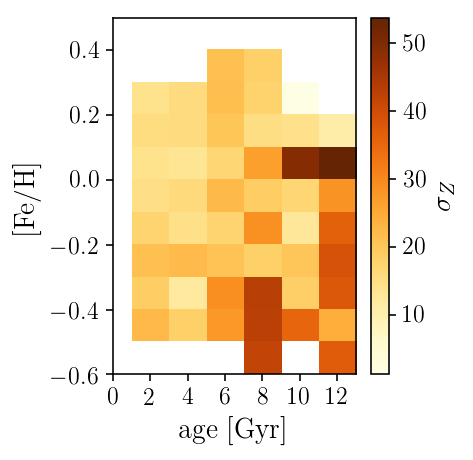

In [96]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(10**np.rot90(co_par[:,:,5,1]), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

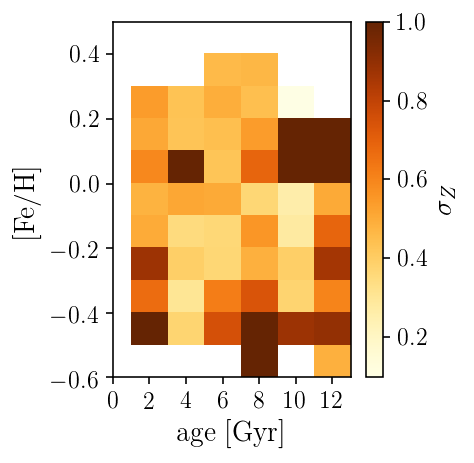

In [97]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(np.rot90(10**co_par[:,:,5,1]/10**co_par[:,:,1,1]), extent=extent, aspect='auto', cmap=cm_heat, vmax=1.)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

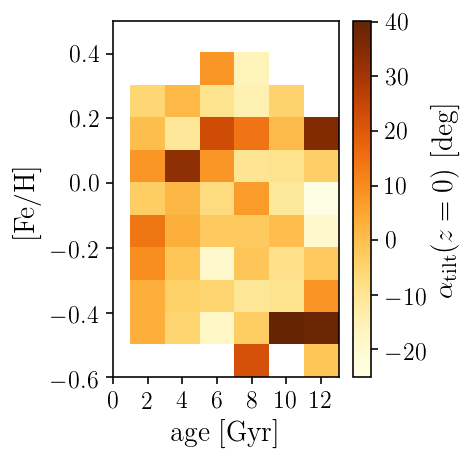

In [98]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(np.rot90(np.arctan(co_par[:,:,8,1])*180./np.pi), extent=extent, aspect='auto', cmap=cm_heat)

plt.colorbar(s0, label=r'$\alpha_{\mathrm{tilt}}(z=0)\ \mathrm{[deg]}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

/home/astjmack/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: overflow encountered in square
  



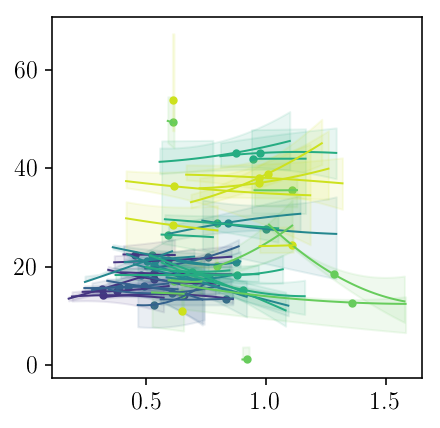

In [99]:
agegrid = (np.ones([len(agebins)-1, len(fehbins)-1]).T*((agebins[1:]+agebins[:-1])/2.)).T
fehgrid = (np.ones([len(agebins)-1, len(fehbins)-1])*((fehbins[1:]+fehbins[:-1])/2.))


def sigma_profile(zs, a,b,c,med_z):
    prof = a*(zs-med_z)**2+b*(zs-med_z)+c
    return prof

def sigma_fz(par, i, j, med_z, sigmaR=False, returnprof=False, ax=None, color='Black'):
    zs = np.linspace(med_z[i,j][1], med_z[i,j][3], 50)
    if not sigmaR:
        a,b,c = par[i,j,6,1], par[i,j,7,1], 10**par[i,j,5,1]
        medianprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,6,0], par[i,j,7,0], 10**par[i,j,5,0]
        loprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,6,2], par[i,j,7,2], 10**par[i,j,5,2]
        hiprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        pind = 5
    else:
        a,b,c = par[i,j,2,1], par[i,j,3,1], 10**par[i,j,1,1]
        medianprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,2,0], par[i,j,3,0], 10**par[i,j,1,0]
        loprof = sigma_profile(zs, a, b, c, med_z[i,j,2])
        a,b,c = par[i,j,2,2], par[i,j,3,2], 10**par[i,j,1,2]
        hiprof = sigma_profile(zs, a, b, c, med_z[i,j,2])   
        pind = 1
    if returnprof:
        return zs, medianprof, loprof, hiprof
    if not ax == None:
        ax.plot(zs, medianprof, color=color)
        ax.fill_between(zs, loprof, hiprof, color=color, alpha=0.1)
        ax.scatter(med_z[i,j,2], 10**par[i,j,pind,1], color=color, s=10)
        return None
    plt.plot(zs, medianprof, color=color)
    plt.fill_between(zs, loprof, hiprof, color=color, alpha=0.1)
    plt.scatter(med_z[i,j,2], 10**par[i,j,pind,1], color=color, s=10)   
    

fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        sigma_fz(co_par, i, j, co_med_z, sigmaR=False, color=plt.cm.viridis((agegrid[i,j]/np.max(dat['Age']))))

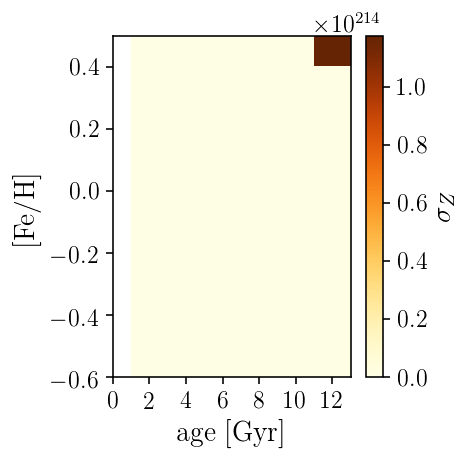

In [100]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
extent = [agebins[0], agebins[-1], fehbins[0], fehbins[-1]]
s0 = plt.imshow(np.rot90(co_med_z[:,:,2]), extent=extent, aspect='auto', cmap=cm_heat, vmin=0.)

plt.colorbar(s0, label=r'$\sigma_{Z}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

Text(0.5,0,'$\\mathrm{age\\ [Gyr]}$')

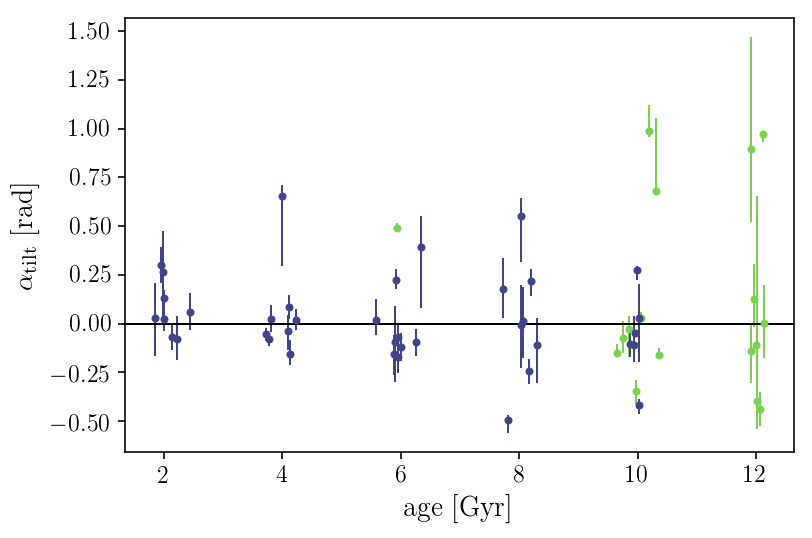

In [101]:
yerr = np.dstack([hi_par[:,:,8,1].ravel()-hi_par[:,:,8,0].ravel(), hi_par[:,:,8,2].ravel()-hi_par[:,:,8,1].ravel()])[0].T
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), hi_par[:,:,8,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.8))
yerr = np.dstack([lo_par[:,:,8,1].ravel()-lo_par[:,:,8,0].ravel(), lo_par[:,:,8,2].ravel()-lo_par[:,:,8,1].ravel()])[0].T
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), lo_par[:,:,8,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.2))

plt.axhline(0., c='Black')
plt.ylabel(r'$\alpha_{\mathrm{tilt}}\ \mathrm{[rad]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')

Text(0.5,0,'$\\mathrm{age\\ [Gyr]}$')

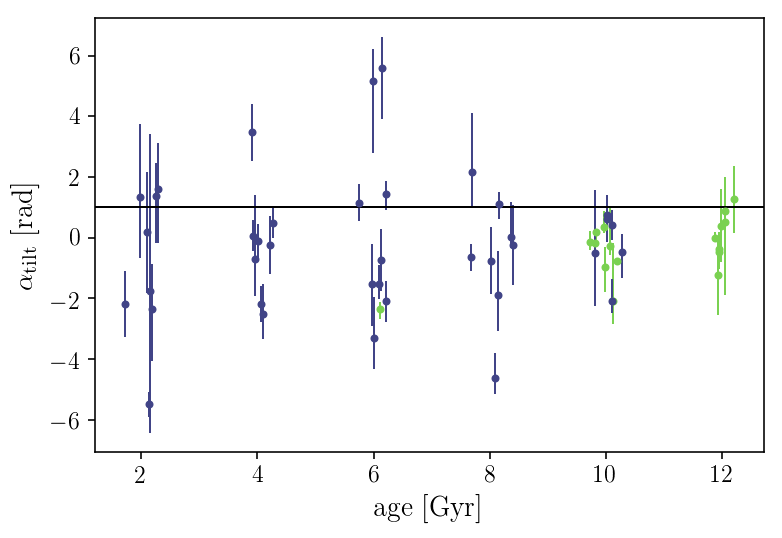

In [102]:
yerr = np.dstack([hi_par[:,:,9,1].ravel()-hi_par[:,:,9,0].ravel(), hi_par[:,:,9,2].ravel()-hi_par[:,:,9,1].ravel()])[0].T
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), hi_par[:,:,9,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.8))
yerr = np.dstack([lo_par[:,:,9,1].ravel()-lo_par[:,:,9,0].ravel(), lo_par[:,:,9,2].ravel()-lo_par[:,:,9,1].ravel()])[0].T
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), lo_par[:,:,9,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.2))

plt.axhline(1., c='Black')
plt.ylabel(r'$\alpha_{\mathrm{tilt}}\ \mathrm{[rad]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')

Text(0.5,0,'$\\mathrm{age\\ [Gyr]}$')

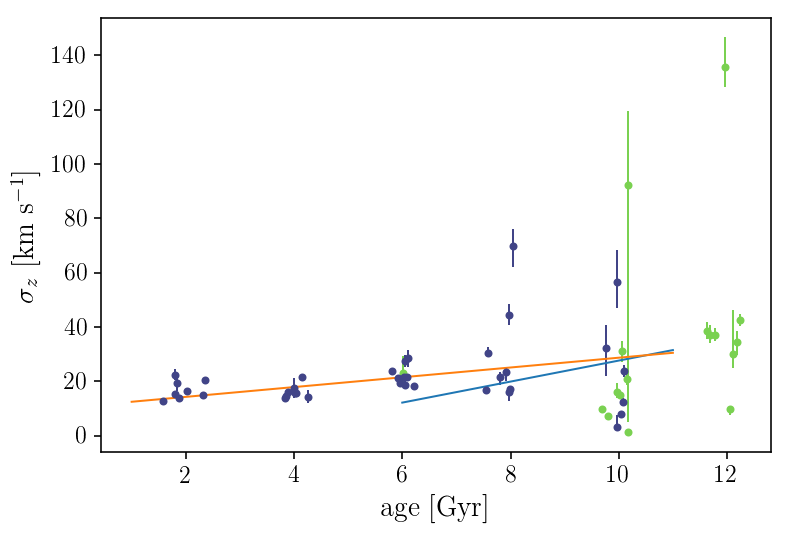

In [103]:
def lnlike(theta, x, y, yerr):
    m, b, lnf = theta
    model = m * x + b
    inv_sigma2 = 1.0/(yerr**2 + model**2*np.exp(2*lnf))
    return -0.5*(np.nansum((y-model)**2*inv_sigma2 - np.log(inv_sigma2)))

import scipy.optimize as op
nll = lambda *args: -lnlike(*args)

yerr = np.dstack([10**hi_par[:,:,5,1].ravel()-10**hi_par[:,:,5,0].ravel(), 10**hi_par[:,:,5,2].ravel()-10**hi_par[:,:,5,1].ravel()])[0].T
x = agegrid.ravel()
y = 10**hi_par[:,:,5,1].ravel()
result = op.minimize(nll, [0.1, 0, np.log(0.8)], args=(x, y, yerr))
m_ml, b_ml, lnf_ml = result["x"]
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), 10**hi_par[:,:,5,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.8))
xs = np.linspace(6.,11.,10)
plt.plot(xs, m_ml*xs+b_ml)
yerr = np.dstack([10**lo_par[:,:,5,1].ravel()-10**lo_par[:,:,5,0].ravel(), 10**lo_par[:,:,5,2].ravel()-10**lo_par[:,:,5,1].ravel()])[0].T
x = agegrid.ravel()
y = 10**lo_par[:,:,5,1].ravel()
result = op.minimize(nll, [0.1, 0, np.log(0.8)], args=(x, y, yerr))
m_ml, b_ml, lnf_ml = result["x"]
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), 10**lo_par[:,:,5,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.2))
xs = np.linspace(1.,11.,10)
plt.plot(xs, m_ml*xs+b_ml)

plt.ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')

Text(0.5,0,'$\\mathrm{age\\ [Gyr]}$')

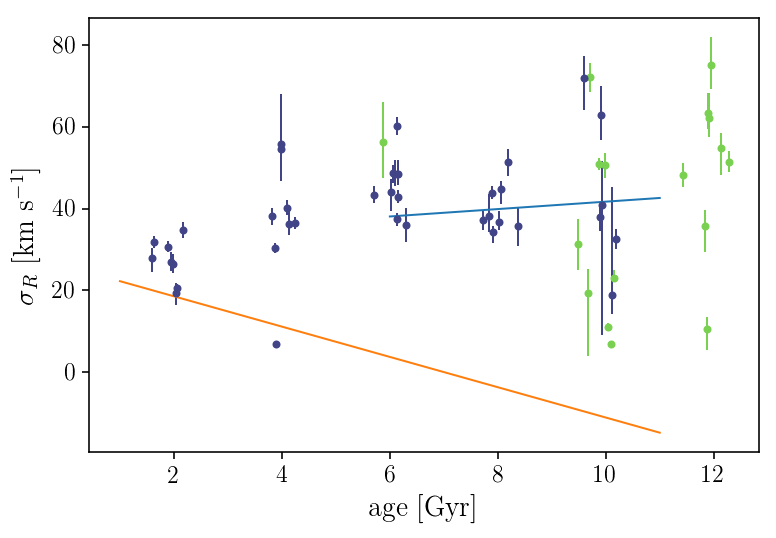

In [104]:
yerr = np.dstack([10**hi_par[:,:,1,1].ravel()-10**hi_par[:,:,1,0].ravel(), 10**hi_par[:,:,1,2].ravel()-10**hi_par[:,:,1,1].ravel()])[0].T
x = agegrid.ravel()
y = 10**hi_par[:,:,1,1].ravel()
result = op.minimize(nll, [0.1, 0, np.log(0.8)], args=(x, y, yerr))
m_ml, b_ml, lnf_ml = result["x"]
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), 10**hi_par[:,:,1,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.8))
xs = np.linspace(6.,11.,10)
plt.plot(xs, m_ml*xs+b_ml)
yerr = np.dstack([10**lo_par[:,:,1,1].ravel()-10**lo_par[:,:,1,0].ravel(), 10**lo_par[:,:,1,2].ravel()-10**lo_par[:,:,1,1].ravel()])[0].T
x = agegrid.ravel()
y = 10**lo_par[:,:,1,1].ravel()
result = op.minimize(nll, [0.1, 0, np.log(0.8)], args=(x, y, yerr))
m_ml, b_ml, lnf_ml = result["x"]
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), 10**lo_par[:,:,1,1].ravel(), yerr=yerr, fmt='.', c=plt.cm.viridis(0.2))
xs = np.linspace(1.,11.,10)
plt.plot(xs, m_ml*xs+b_ml)

plt.ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')

Text(0.5,0,'$\\mathrm{age\\ [Gyr]}$')

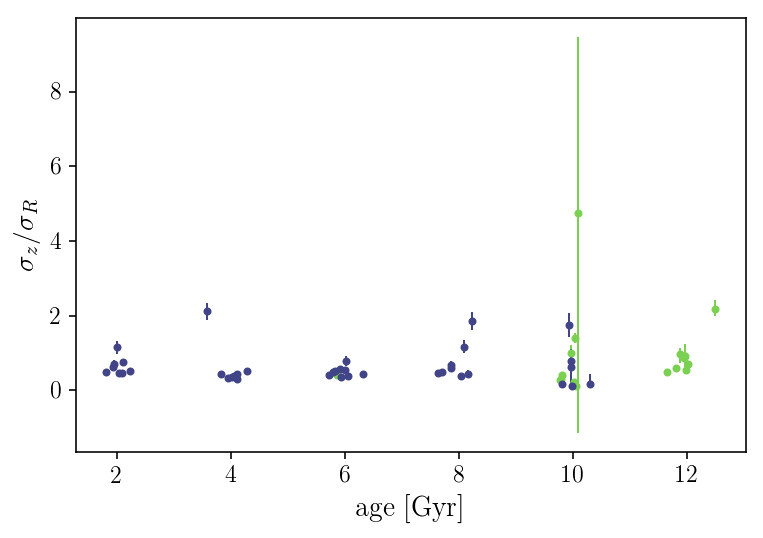

In [105]:
yerr = np.dstack([10**hi_par[:,:,1,0].ravel()-10**hi_par[:,:,1,1].ravel(), 10**hi_par[:,:,1,2].ravel()-10**hi_par[:,:,1,1].ravel()])[0].T
yerr_1 = np.dstack([10**hi_par[:,:,5,0].ravel()-10**hi_par[:,:,5,1].ravel(), 10**hi_par[:,:,5,0].ravel()-10**hi_par[:,:,5,1].ravel()])[0].T
hi_val = 10**hi_par[:,:,5,1].ravel()/10**hi_par[:,:,1,1].ravel()
hi_yerr = hi_val*np.sqrt((yerr/10**hi_par[:,:,1,1].ravel())**2+(yerr_1/10**hi_par[:,:,5,1].ravel())**2)
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), hi_val, yerr=hi_yerr, fmt='.', c=plt.cm.viridis(0.8))
yerr = np.dstack([10**lo_par[:,:,1,0].ravel()-10**lo_par[:,:,1,1].ravel(), 10**lo_par[:,:,1,2].ravel()-10**lo_par[:,:,1,1].ravel()])[0].T
yerr_1 = np.dstack([10**lo_par[:,:,5,0].ravel()-10**lo_par[:,:,5,1].ravel(), 10**lo_par[:,:,5,0].ravel()-10**lo_par[:,:,5,1].ravel()])[0].T
lo_val = 10**lo_par[:,:,5,1].ravel()/10**lo_par[:,:,1,1].ravel()
lo_yerr = lo_val*np.sqrt((yerr/10**lo_par[:,:,1,1].ravel())**2+(yerr_1/10**lo_par[:,:,5,1].ravel())**2)
plt.errorbar(agegrid.ravel()+0.2*np.random.randn(len(agegrid.ravel())), lo_val, yerr=lo_yerr, fmt='.', c=plt.cm.viridis(0.2))


plt.ylabel(r'$\sigma_{z}/\sigma_{R}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')

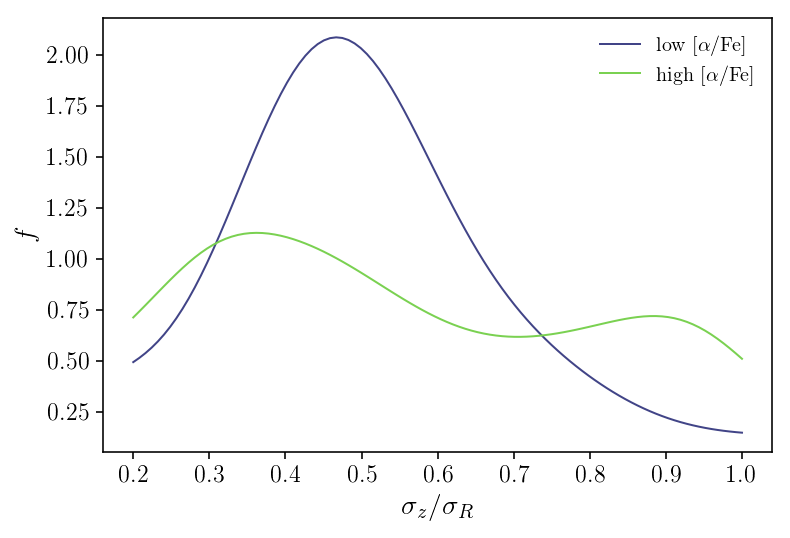

In [106]:
px = np.linspace(0.2,1.,100)

vals = 10**lo_samples[:,:,:,5].ravel()/10**lo_samples[:,:,:,1].ravel()
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.2), label=r'$\mathrm{low\ [\alpha/Fe]}$')

vals = 10**hi_samples[:,:,:,5].ravel()/10**hi_samples[:,:,:,1].ravel()
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.8), label=r'$\mathrm{high\ [\alpha/Fe]}$')

plt.xlabel(r'$\sigma_{z}/\sigma_{R}$')
plt.ylabel(r'$f$')
plt.legend(frameon=False, loc=1)

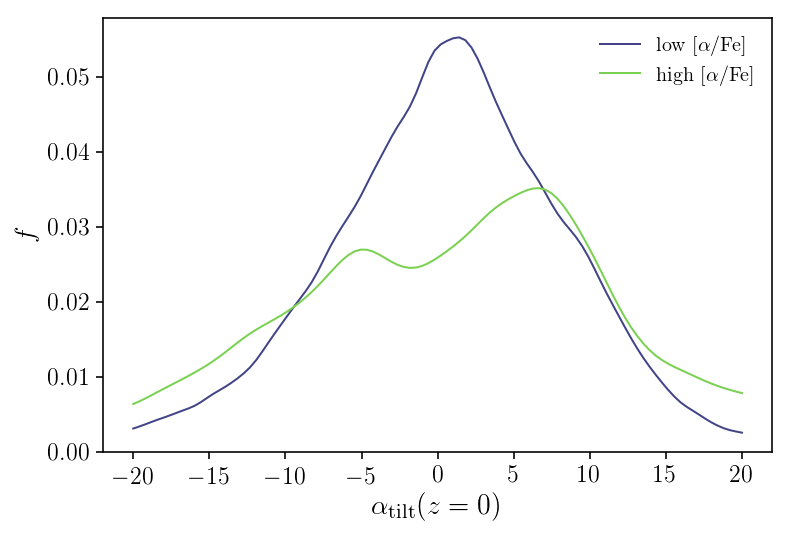

In [35]:
px = np.linspace(-20.,20.,100)

vals = np.arctan(lo_samples[:,:,:,8].ravel())*180./np.pi
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.2), label=r'$\mathrm{low\ [\alpha/Fe]}$')

vals = np.arctan(hi_samples[:,:,:,8].ravel())*180./np.pi
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.8), label=r'$\mathrm{high\ [\alpha/Fe]}$')

plt.xlabel(r'$\alpha_{\mathrm{tilt}}(z=0)$')
plt.ylabel(r'$f$')
plt.legend(frameon=False, loc=1)